# Analyse des données de schizophrénie


# Description des données

SchizoHealth Dataset

This dataset is a comprehensive collection of demographic, clinical, and psychosocial information about schizophrenia patients. It serves as a valuable resource for researchers, doctors, and data scientists. The dataset includes patients' diagnosis status, symptom scores, treatment history, and social factors.

Columns and Descriptions

* Patient_ID – Unique identifier assigned to each patient
* Age – Patient's age (between 18 and 80)
* Gender – 0: Female, 1: Male
* Education_Level – 1: Primary, 2: Middle School, 3: High School, 4: University, 5: Postgraduate
* Marital_Status – 0: Single, 1: Married, 2: Divorced, 3: Widowed
* Occupation – 0: Unemployed, 1: Employed, 2: Retired, 3: Student
* Income_Level – 0: Low, 1: Medium, 2: High
* Living_Area – 0: Rural, 1: Urban
* Diagnosis – 0: Not schizophrenic, 1: Schizophrenic
* Disease_Duration – Duration of illness for schizophrenia patients (1-40 years)
* Hospitalizations – Number of hospital admissions (ranges from 0 to 10 for schizophrenia patients)
* Family_History – 0: No, 1: Yes (Genetic predisposition)
* Substance_Use – 0: No, 1: Yes (Tobacco, alcohol, or other substances)
* Suicide_Attempt – 0: No, 1: Yes
* Positive_Symptom_Score – Ranges from 0 to 100 (Higher scores indicate more symptoms)
* Negative_Symptom_Score – Ranges from 0 to 100 (Higher scores indicate more negative symptoms)
* GAF_Score – Global Assessment of Functioning (Ranges from 0 to 100, lower scores indicate worse functioning)
* Social_Support – 0: Low, 1: Medium, 2: High
* Stress_Factors – 0: Low, 1: Medium, 2: High
* Medication_Adherence – 0: Poor, 1: Moderate, 2: Good

This dataset has been carefully designed for schizophrenia research.

🔹 **Note: This is a synthetic dataset and does not contain real patient data. 🚀

# Pré-traitement

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency


sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)

In [ ]:

df = pd.read_csv('/content/drive/MyDrive/schizophrenia_dataset.csv')


column_mapping = {
    'Hasta_ID': 'ID',
    'Yaş': 'Age',
    'Cinsiyet': 'Gender',
    'Eğitim_Seviyesi': 'Education',
    'Medeni_Durum': 'Marital_Status',
    'Meslek': 'Occupation',
    'Gelir_Düzeyi': 'Income',
    'Yaşadığı_Yer': 'Residence',
    'Tanı': 'Diagnosis',
    'Hastalık_Süresi': 'Illness_Duration',
    'Hastaneye_Yatış_Sayısı': 'Hospitalizations',
    'Ailede_Şizofreni_Öyküsü': 'Family_History',
    'Madde_Kullanımı': 'Substance_Use',
    'İntihar_Girişimi': 'Suicide_Attempt',
    'Pozitif_Semptom_Skoru': 'Positive_Symptoms',
    'Negatif_Semptom_Skoru': 'Negative_Symptoms',
    'GAF_Skoru': 'GAF_Score',
    'Sosyal_Destek': 'Social_Support',
    'Stres_Faktörleri': 'Stress_Factors',
    'İlaç_Uyumu': 'Medication_Adherence'
}
df = df.rename(columns=column_mapping)


In [ ]:
df.describe()

,ID,Age,Gender,Education,Marital_Status,Occupation,Income,Residence,Diagnosis,Illness_Duration,Hospitalizations,Family_History,Substance_Use,Suicide_Attempt,Positive_Symptoms,Negative_Symptoms,GAF_Score,Social_Support,Stress_Factors,Medication_Adherence
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,48.867700,0.502600,3.042600,1.518200,1.510600,0.996900,0.499400,0.288700,5.859000,1.440300,0.319600,0.217700,0.08840,39.019000,39.4614,67.031800,0.992500,0.998700,1.137500
std,2886.89568,18.215054,0.500018,1.423021,1.117315,1.114097,0.817531,0.500025,0.453181,11.066814,2.824152,0.466345,0.412703,0.28389,27.276962,27.0175,23.999833,0.813578,0.817169,0.821378
min,1.00000,18.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.0000,10.000000,0.000000,0.000000,0.000000
25%,2500.75000,33.000000,0.000000,2.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,17.000000,18.0000,54.000000,0.000000,0.000000,0.000000
50%,5000.50000,49.000000,1.000000,3.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,35.000000,35.0000,72.000000,1.000000,1.000000,1.000000
75%,7500.25000,65.000000,1.000000,4.000000,3.000000,3.000000,2.000000,1.000000,1.000000,5.250000,1.000000,1.000000,0.000000,0.00000,57.000000,57.0000,86.000000,2.000000,2.000000,2.000000
max,10000.00000,80.000000,1.000000,5.000000,3.000000,3.000000,2.000000,1.000000,1.000000,40.000000,10.000000,1.000000,1.000000,1.00000,100.000000,100.0000,100.000000,2.000000,2.000000,2.000000


In [ ]:
import pandas as pd
import numpy as np

# Fonction standard utilisant pd.qcut pour découper selon les quantiles
def convert_to_category_quantile(data, column, q):
    """
    Découpe la variable 'column' en q quantiles et retourne une variable catégorielle
    dont les labels reprennent les bornes de l'intervalle.
    """
    cat, bins = pd.qcut(data[column], q=q, retbins=True, duplicates='drop')
    labels = [f"{round(bins[i],2)}-{round(bins[i+1],2)}" for i in range(len(bins)-1)]
    return pd.cut(data[column], bins=bins, labels=labels, include_lowest=True)

# Fonction spéciale pour traiter les 0 séparément pour certaines variables
def convert_to_category_with_zero(data, column, q):
    """
    Convertit la variable quantitative 'column' en variable qualitative en créant une modalité "0"
    pour les valeurs nulles, et en découpant les valeurs strictement positives en (q-1) quantiles.

    q correspond au nombre total de catégories souhaité (minimum 2).
    """
    X = data[column]
    # Si toutes les valeurs sont 0, on renvoie une série constante
    if (X == 0).all():
        return pd.Series(["0"] * len(X), index=X.index, dtype="category")

    result = pd.Series(index=X.index, dtype="object")
    # Affectation de la modalité "0" pour les zéros
    mask_zero = (X == 0)
    result[mask_zero] = "0"

    # Traitement des valeurs strictement positives
    positive = X[X > 0]
    if not positive.empty:
        num_bins = q - 1  # le nombre de bins pour les valeurs > 0
        pos_cat, bins = pd.qcut(positive, q=num_bins, retbins=True, duplicates='drop')
        pos_labels = [f"{round(bins[i],2)}-{round(bins[i+1],2)}" for i in range(len(bins)-1)]
        pos_cut = pd.cut(positive, bins=bins, labels=pos_labels, include_lowest=True)
        result[positive.index] = pos_cut

    return result.astype("category")

# Configuration : nombre de catégories souhaité pour chaque variable
# Pour Hospitalizations et Illness_Duration, la modalité "0" sera créée, et les autres catégories seront obtenues en (q-1) quantiles.
conversion_config = {
    'Age': 3,
    'Illness_Duration': 3,  # 1 catégorie pour 0, et 2 pour les valeurs positives
    'Hospitalizations': 3,  # 1 catégorie pour 0, et 2 pour les valeurs positives
    'Positive_Symptoms': 5,
    'Negative_Symptoms': 5,
    'GAF_Score': 5
}

# Application des conversions pour chaque variable quantitative
for col, q in conversion_config.items():
    print(col)
    if col in df.columns:
        if col in ["Illness_Duration", "Hospitalizations"]:
            df[f'{col}_C'] = convert_to_category_with_zero(df, col, q)
        else:
            df[f'{col}_C'] = convert_to_category_quantile(df, col, q)

# Suppression des colonnes quantitatives d'origine (celles présentes dans conversion_config)
cols_to_drop = [col for col in conversion_config.keys() if col in df.columns]
df.drop(columns=cols_to_drop, inplace=True)

# Nettoyage des noms de colonnes (suppression des espaces invisibles)
df.rename(columns=lambda x: x.strip(), inplace=True)

# Vérification des valeurs manquantes dans les nouvelles variables qualitatives
for col in conversion_config.keys():
    print(f"NaN dans {col}_C :", df[f"{col}_C"].isna().sum())

# Transformation de toutes les colonnes non catégorielles (sauf 'ID') en type category
for col in df.columns:
    if df[col].dtype != 'category' and col != 'ID':
        df[col] = df[col].astype('category')

# Affichage des colonnes et de leurs types après conversion
print("Colonnes et types après conversion :")
print(df.dtypes)

# Analyse descriptive
desc_table = pd.DataFrame({
    'Variable': df.columns,
    'Type': df.dtypes.values,
    'Missing Values': df.isna().sum().values,
    'Unique Values': df.nunique().values
})

print("Tableau de description des variables :")
display(desc_table)


Age
Illness_Duration
Hospitalizations
Positive_Symptoms
Negative_Symptoms
GAF_Score
NaN dans Age_C : 0
NaN dans Illness_Duration_C : 0
NaN dans Hospitalizations_C : 0
NaN dans Positive_Symptoms_C : 0
NaN dans Negative_Symptoms_C : 0
NaN dans GAF_Score_C : 0
Colonnes et types après conversion :
ID                         int64
Gender                  category
Education               category
Marital_Status          category
Occupation              category
Income                  category
Residence               category
Diagnosis               category
Family_History          category
Substance_Use           category
Suicide_Attempt         category
Social_Support          category
Stress_Factors          category
Medication_Adherence    category
Age_C                   category
Illness_Duration_C      category
Hospitalizations_C      category
Positive_Symptoms_C     category
Negative_Symptoms_C     category
GAF_Score_C             category
dtype: object
Tableau de description des vari

,Variable,Type,Missing Values,Unique Values
0,ID,int64,0,10000
1,Gender,category,0,2
2,Education,category,0,5
3,Marital_Status,category,0,4
4,Occupation,category,0,4
5,Income,category,0,3
6,Residence,category,0,2
7,Diagnosis,category,0,2
8,Family_History,category,0,2
9,Substance_Use,category,0,2


In [ ]:
df.head(150)

,ID,Gender,Education,Marital_Status,Occupation,Income,Residence,Diagnosis,Family_History,Substance_Use,Suicide_Attempt,Social_Support,Stress_Factors,Medication_Adherence,Age_C,Illness_Duration_C,Hospitalizations_C,Positive_Symptoms_C,Negative_Symptoms_C,GAF_Score_C
0,1,1,4,2,0,2,1,0,0,0,0,0,2,2,60.0-80.0,0,0,27.0-42.0,42.0-65.0,66.0-77.0
1,2,1,5,2,2,1,0,1,1,1,1,2,2,0,38.0-60.0,20.0-40.0,1.0-6.0,42.0-66.0,42.0-65.0,10.0-45.0
2,3,1,5,3,2,1,0,1,1,0,0,0,1,1,38.0-60.0,20.0-40.0,0,66.0-100.0,65.0-100.0,45.0-66.0
3,4,1,3,2,0,2,0,0,0,1,0,1,1,2,60.0-80.0,0,0,0.0-13.0,14.0-28.0,66.0-77.0
4,5,0,1,2,0,2,1,0,0,0,0,0,1,0,38.0-60.0,0,0,0.0-13.0,14.0-28.0,89.0-100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,146,0,2,2,3,2,0,0,0,0,0,0,0,2,18.0-38.0,0,0,27.0-42.0,0.0-14.0,66.0-77.0
146,147,0,2,0,3,2,1,0,0,0,0,1,2,1,38.0-60.0,0,0,0.0-13.0,28.0-42.0,66.0-77.0
147,148,1,2,1,0,2,1,0,0,0,0,1,1,0,60.0-80.0,0,0,27.0-42.0,28.0-42.0,45.0-66.0
148,149,0,1,3,2,2,1,0,0,0,0,0,2,2,60.0-80.0,0,0,13.0-27.0,14.0-28.0,66.0-77.0


In [ ]:
df.drop(columns=['ID'], inplace=True)

In [ ]:
df.head()

,Gender,Education,Marital_Status,Occupation,Income,Residence,Diagnosis,Family_History,Substance_Use,Suicide_Attempt,Social_Support,Stress_Factors,Medication_Adherence,Age_C,Illness_Duration_C,Hospitalizations_C,Positive_Symptoms_C,Negative_Symptoms_C,GAF_Score_C
0,1,4,2,0,2,1,0,0,0,0,0,2,2,60.0-80.0,0,0,27.0-42.0,42.0-65.0,66.0-77.0
1,1,5,2,2,1,0,1,1,1,1,2,2,0,38.0-60.0,20.0-40.0,1.0-6.0,42.0-66.0,42.0-65.0,10.0-45.0
2,1,5,3,2,1,0,1,1,0,0,0,1,1,38.0-60.0,20.0-40.0,0,66.0-100.0,65.0-100.0,45.0-66.0
3,1,3,2,0,2,0,0,0,1,0,1,1,2,60.0-80.0,0,0,0.0-13.0,14.0-28.0,66.0-77.0
4,0,1,2,0,2,1,0,0,0,0,0,1,0,38.0-60.0,0,0,0.0-13.0,14.0-28.0,89.0-100.0


#Analyse unidimensionnelle

In [ ]:
# Statistiques descriptives pour toutes les variables qualitatives
print("\n🔹 Statistiques descriptives des variables catégorielles :")
print(df.describe(include='all'))


🔹 Statistiques descriptives des variables catégorielles :
        Gender  Education  Marital_Status  Occupation  Income  Residence  \
count    10000      10000           10000       10000   10000      10000   
unique       2          5               4           4       3          2   
top          1          5               3           1       0          0   
freq      5026       2143            2569        2566    3357       5006   

        Diagnosis  Family_History  Substance_Use  Suicide_Attempt  \
count       10000           10000          10000            10000   
unique          2               2              2                2   
top             0               0              0                0   
freq         7113            6804           7823             9116   

        Social_Support  Stress_Factors  Medication_Adherence      Age_C  \
count            10000           10000                 10000      10000   
unique               3               3                     3    

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


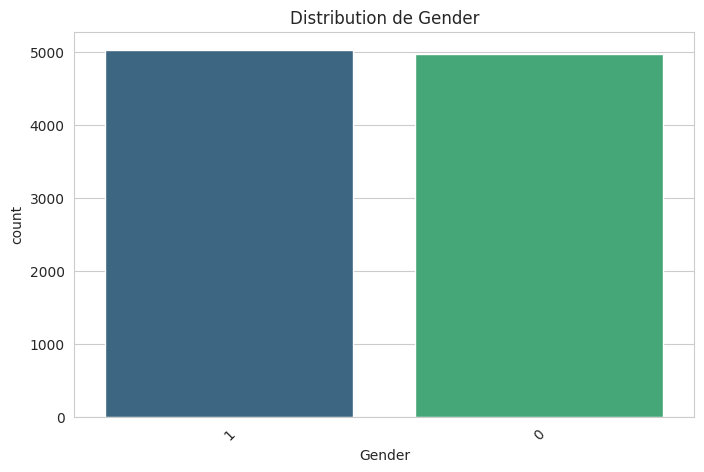

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


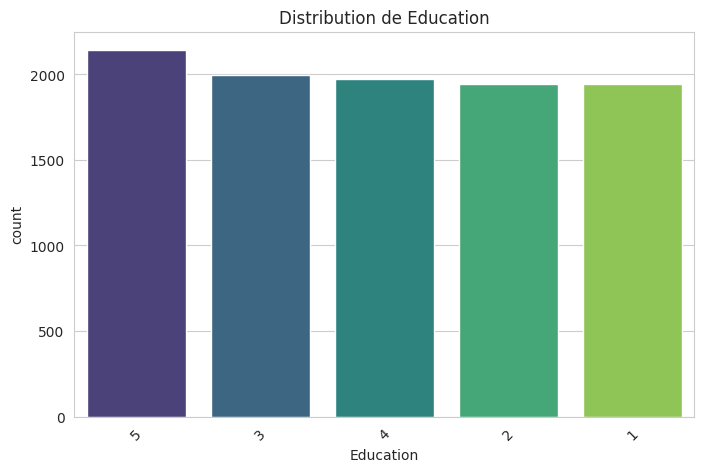

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


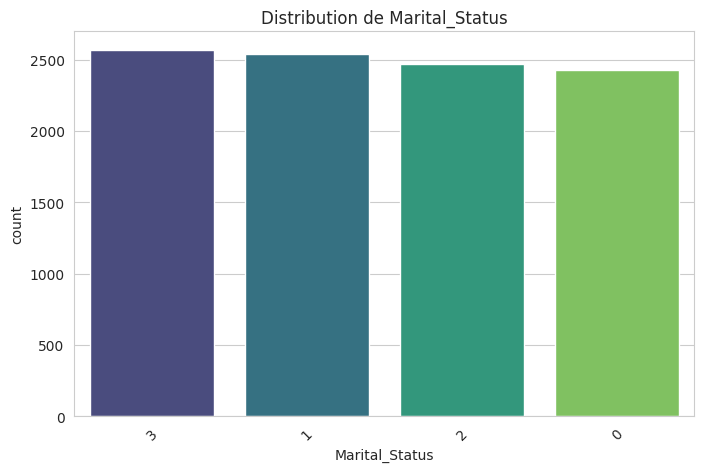

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


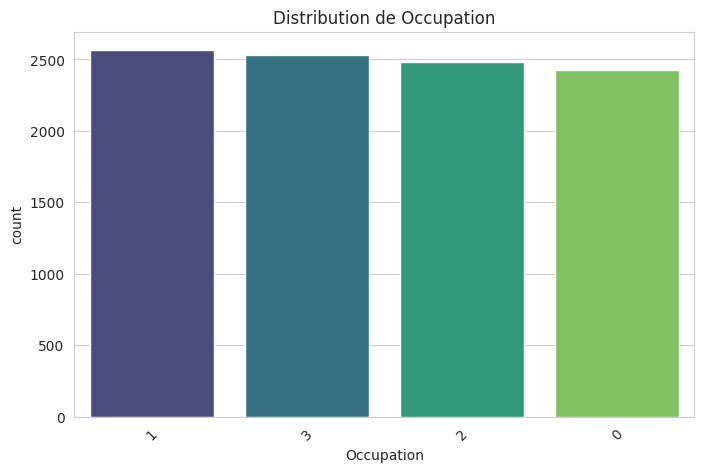

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


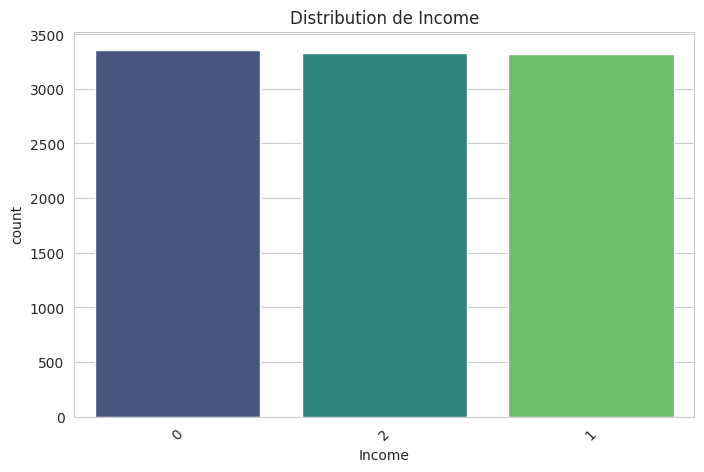

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


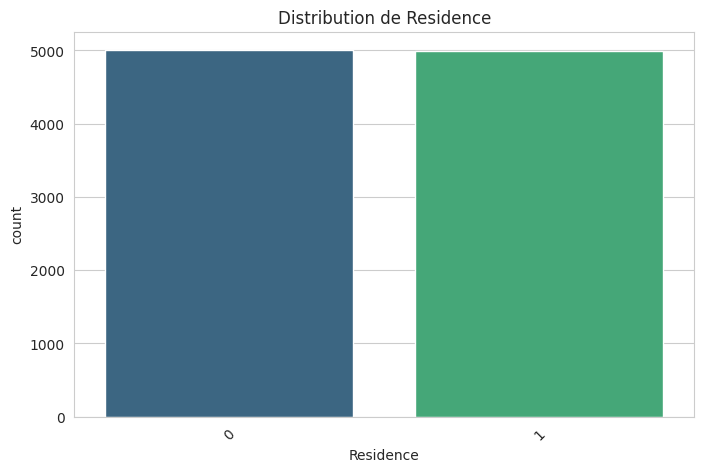

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


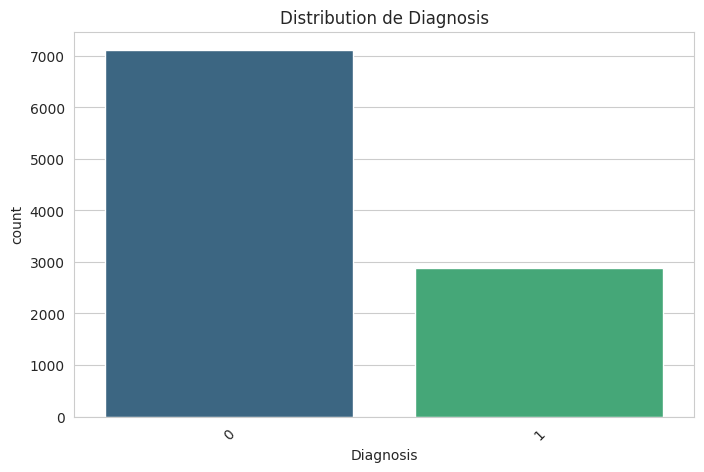

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


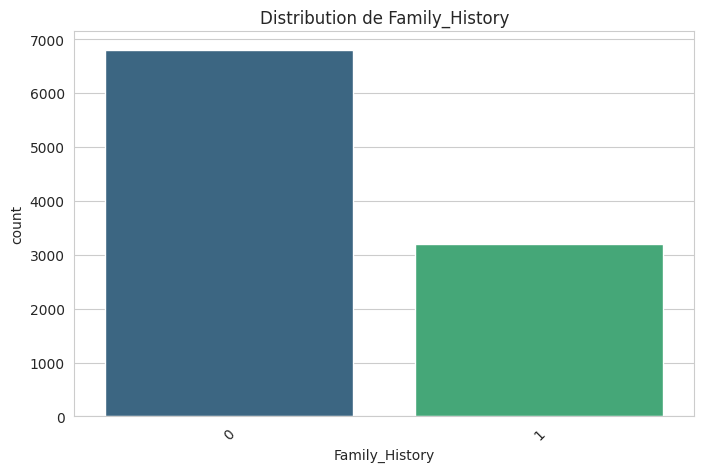

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


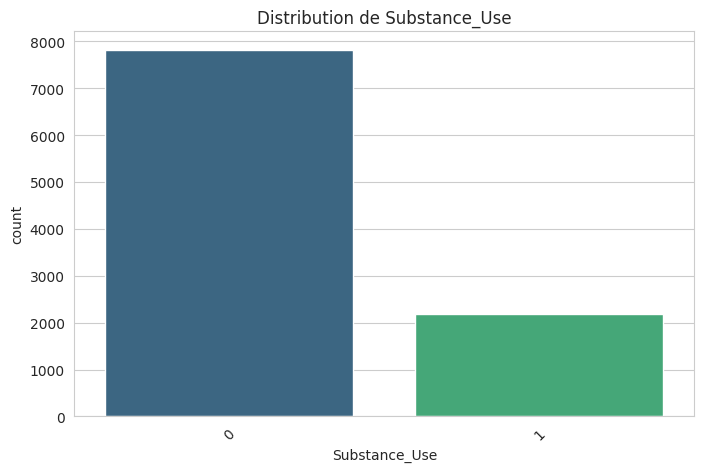

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


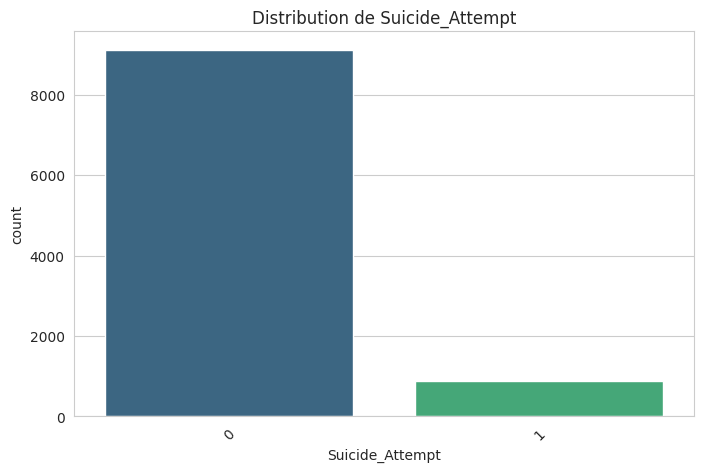

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


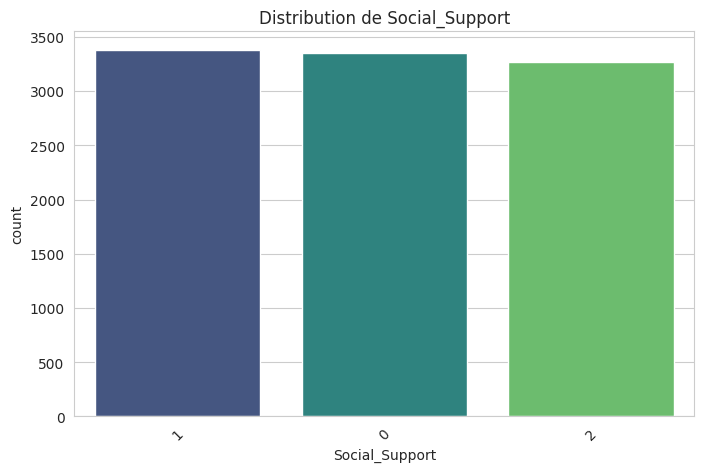

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


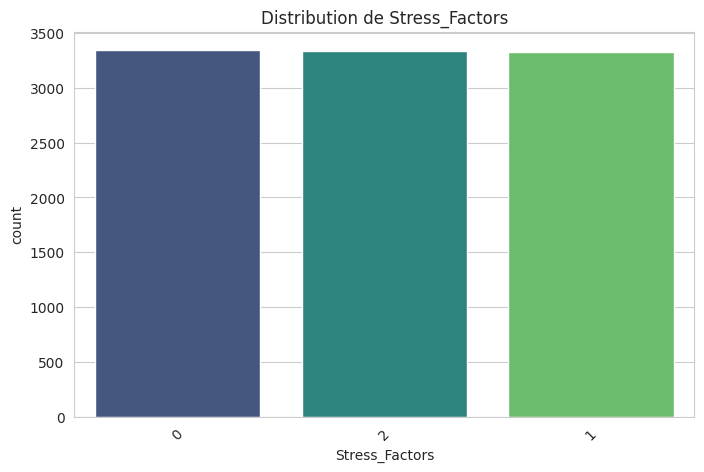

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


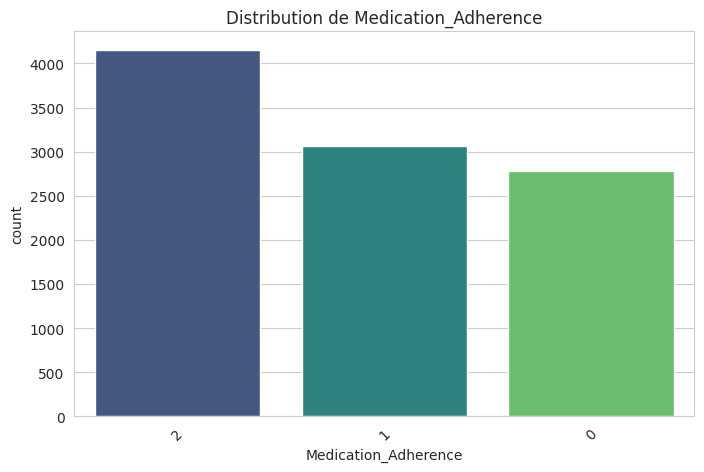

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


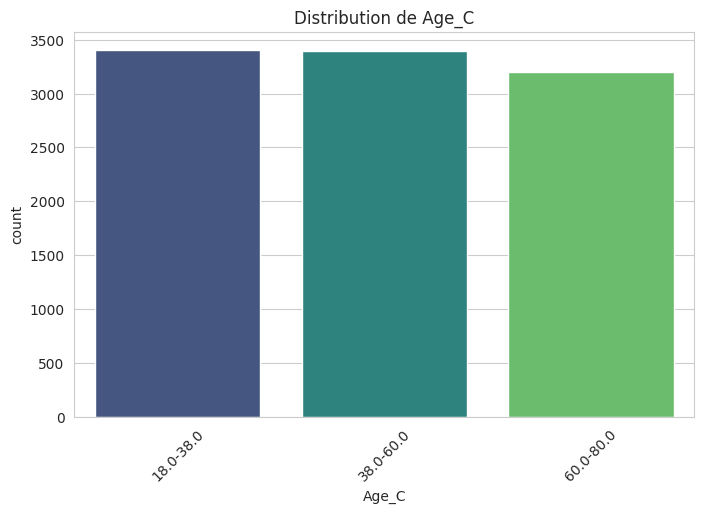

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


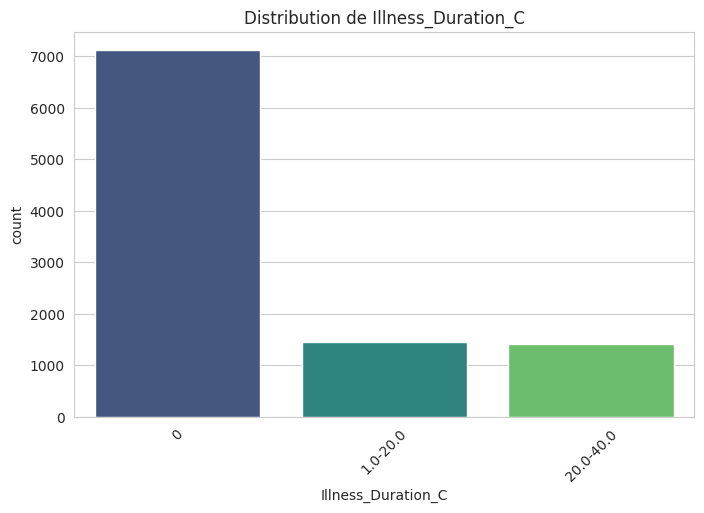

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


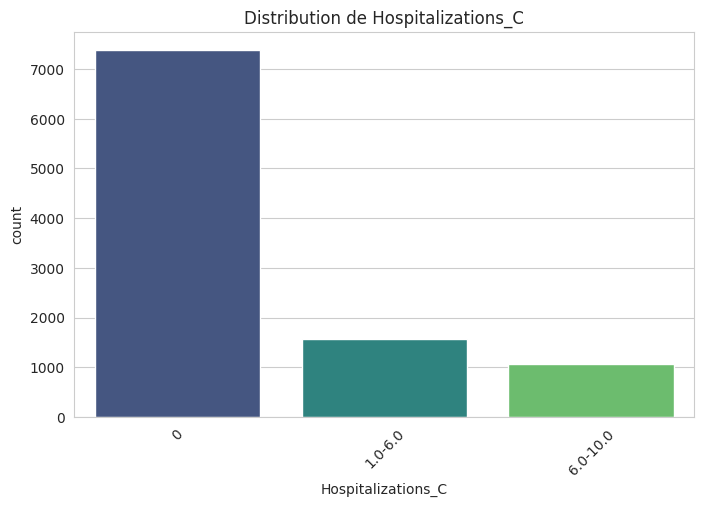

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


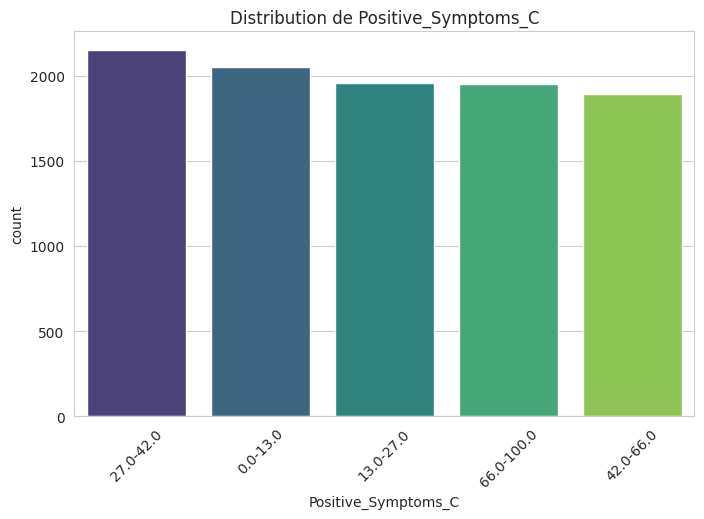

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


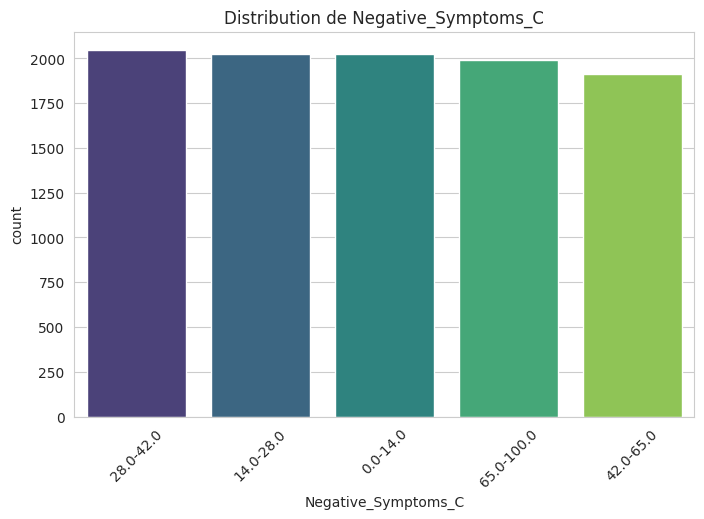

<ipython-input-10-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


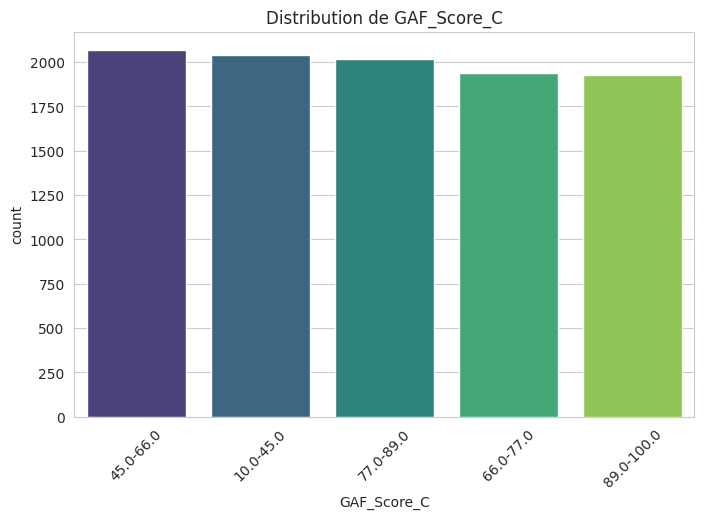

In [ ]:
# Visualisation des distributions pour chaque variable
for col in df.columns:
    plt.figure(figsize=(8, 5))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")
    plt.title(f"Distribution de {col}")
    plt.xticks(rotation=45)
    plt.show()

# Sous-échantillonnage pour équilibré les modalités

In [ ]:
from imblearn.under_sampling import RandomUnderSampler


X = df.drop(columns=['Diagnosis'])
y = df['Diagnosis']

# On définit la stratégie d'échantillonnage.
# Ici, on conserve tous les patients malades (classe 1)
# et on sous-échantillonne la classe 0 pour obtenir un ratio souhaité.
# Par exemple, pour garder 1.5 fois plus d'individus sains que de malades :
n_malade = sum(y == 1)
target_n_sain = int(1.5 * n_malade)
sampling_strategy = {0: target_n_sain, 1: n_malade}

rus = RandomUnderSampler(sampling_strategy=sampling_strategy, random_state=42)
X_res, y_res = rus.fit_resample(X, y)

# Reconstitution du DataFrame équilibré
df_balanced = X_res.copy()
df_balanced['Diagnosis'] = y_res

# Affichage de la répartition après échantillonnage
print("Répartition de Diagnosis après undersampling (via imblearn) :")
print(df_balanced['Diagnosis'].value_counts())


Répartition de Diagnosis après undersampling (via imblearn) :
Diagnosis
0    4330
1    2887
Name: count, dtype: int64


<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


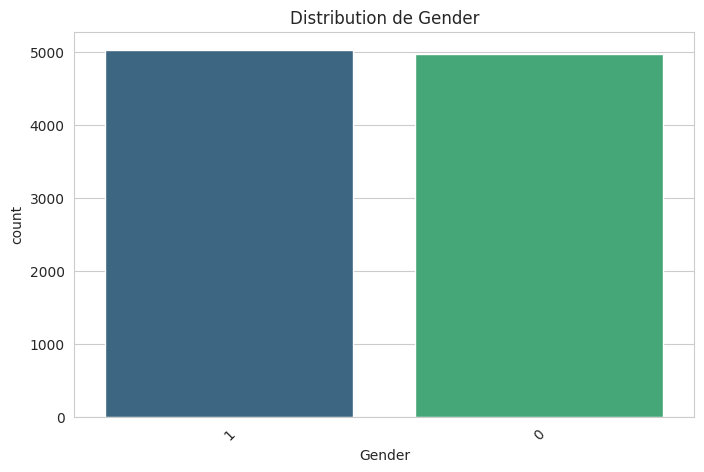

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


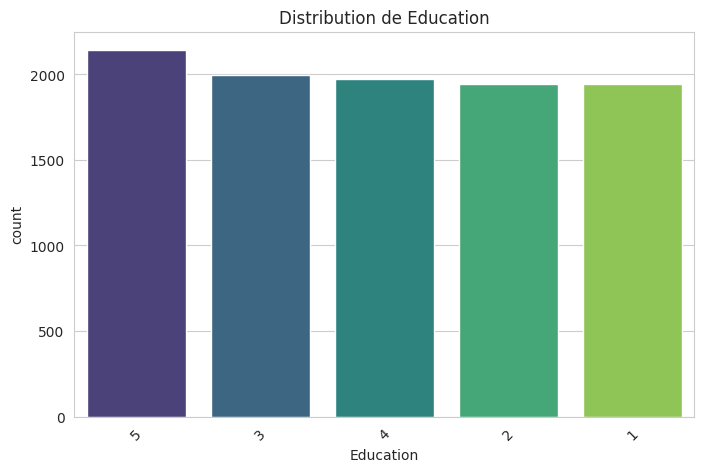

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


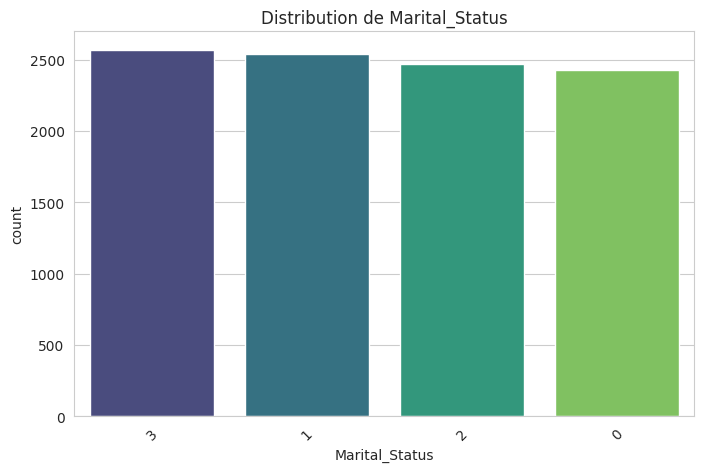

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


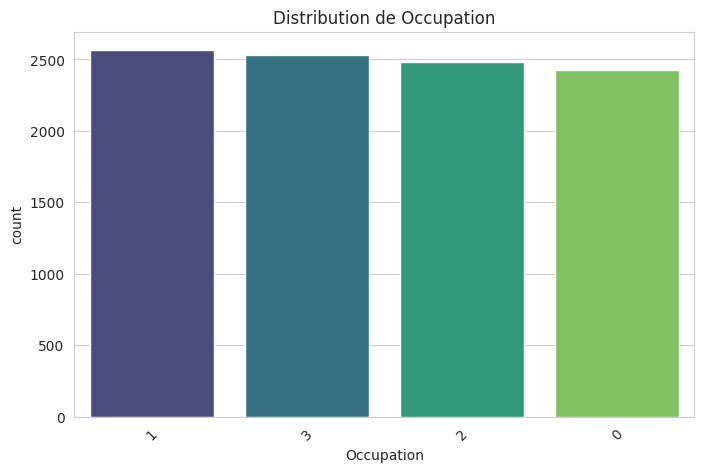

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


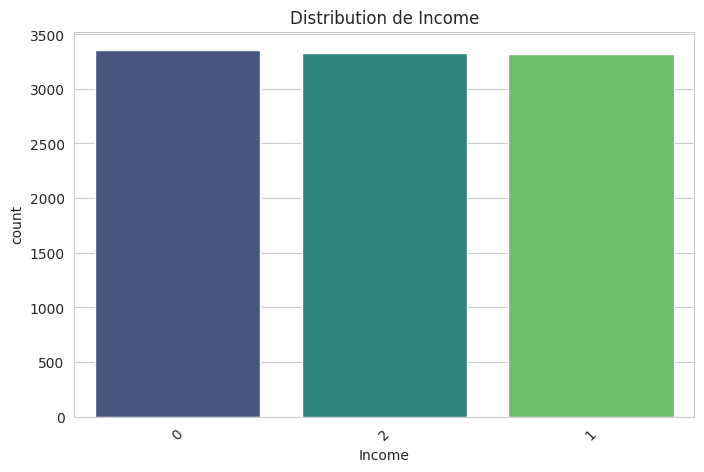

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


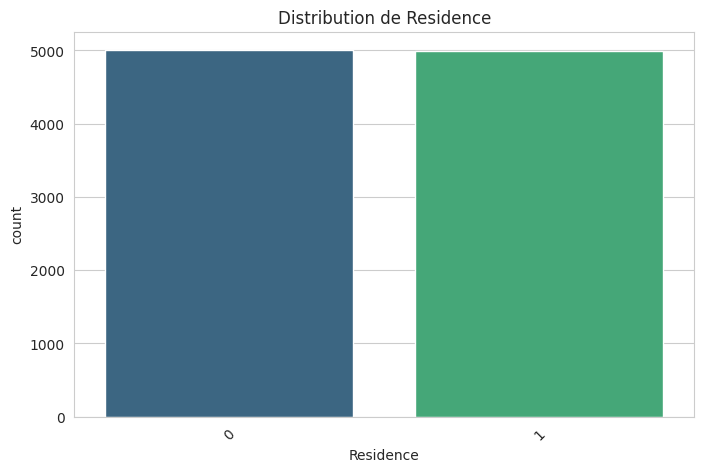

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


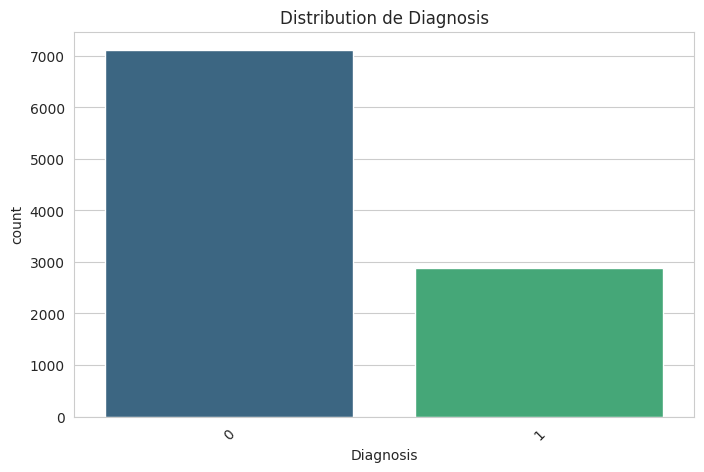

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


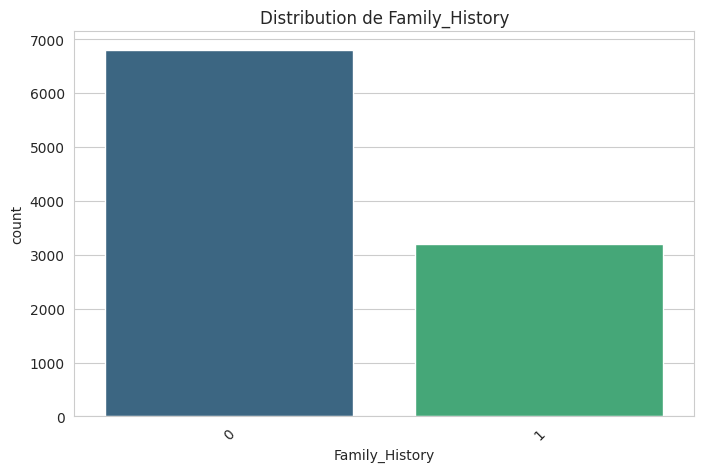

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


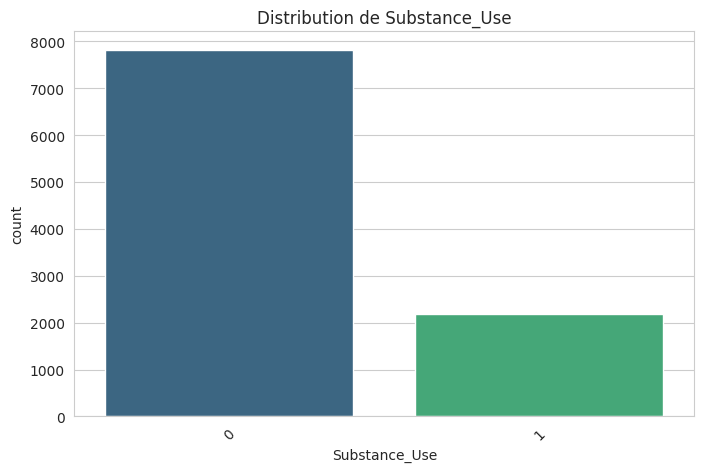

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


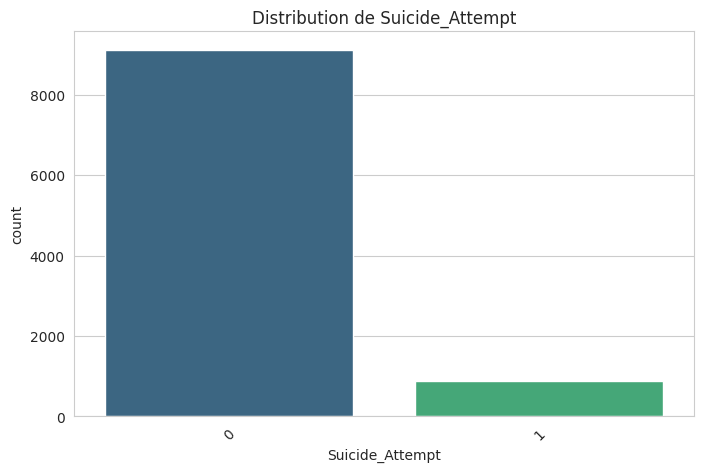

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


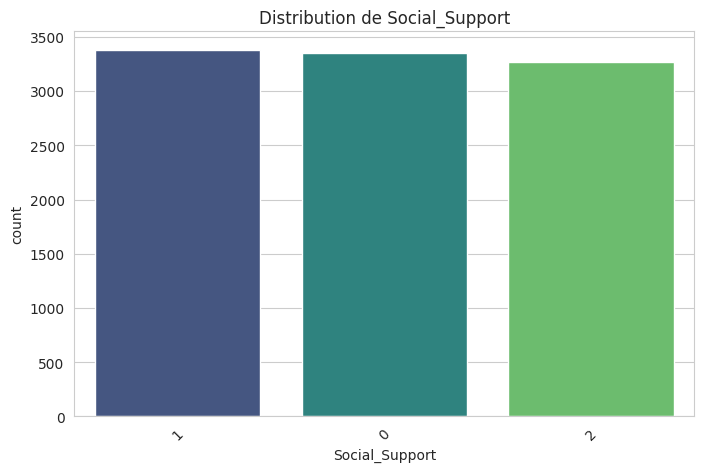

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


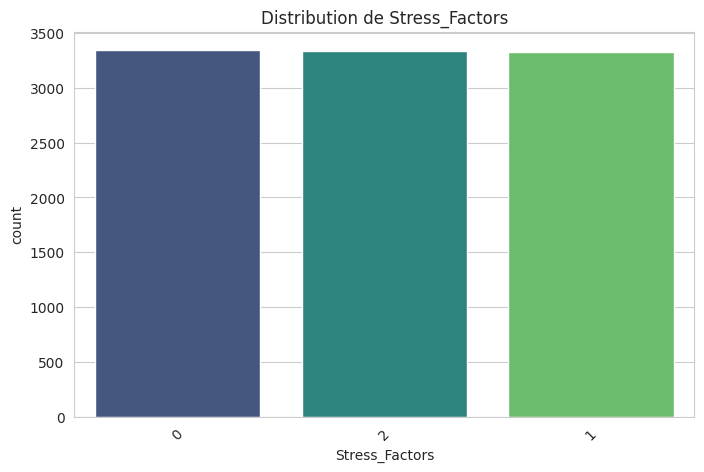

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


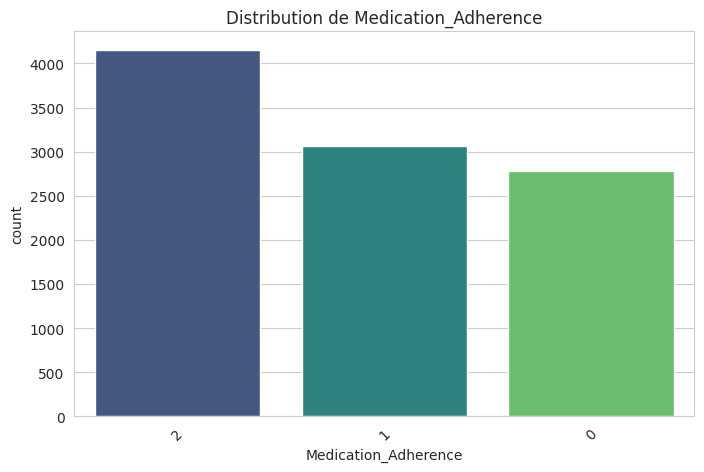

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


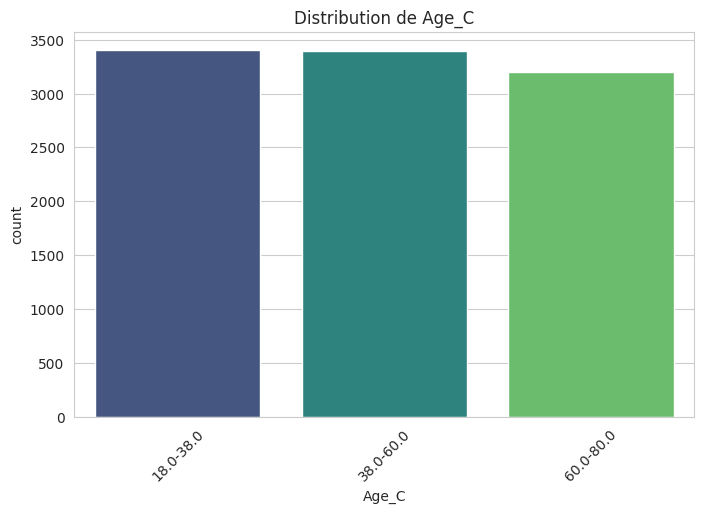

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


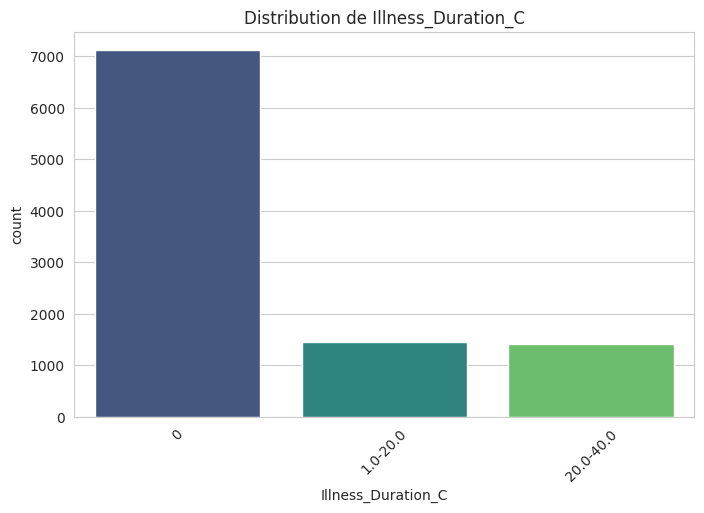

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


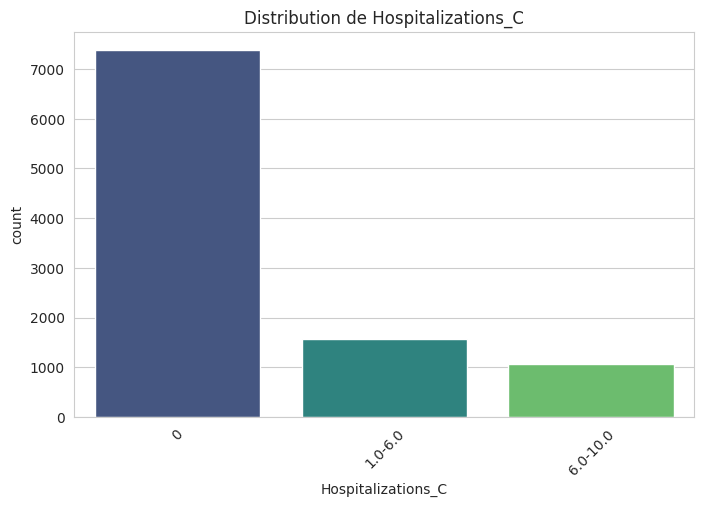

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


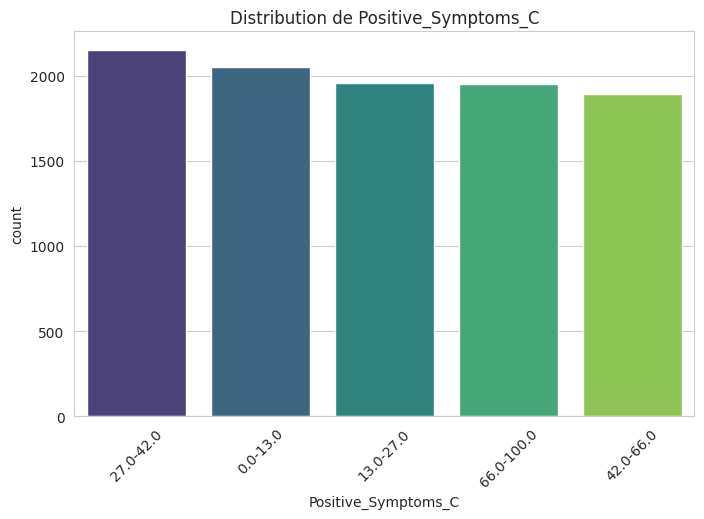

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


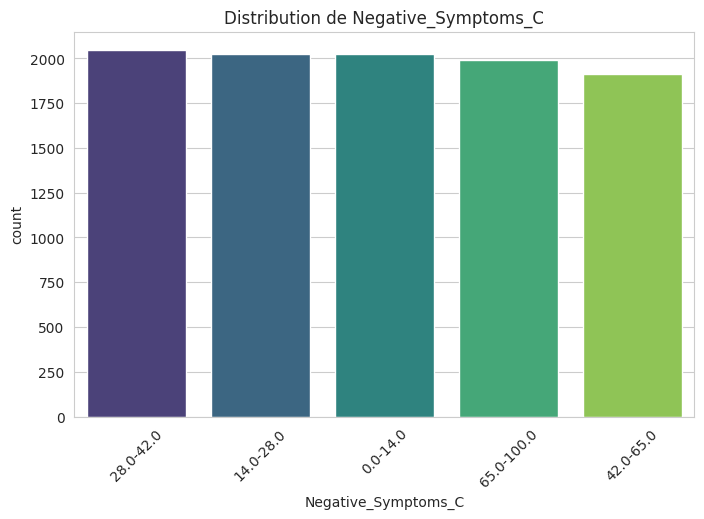

<ipython-input-12-7c33e13773e0>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")


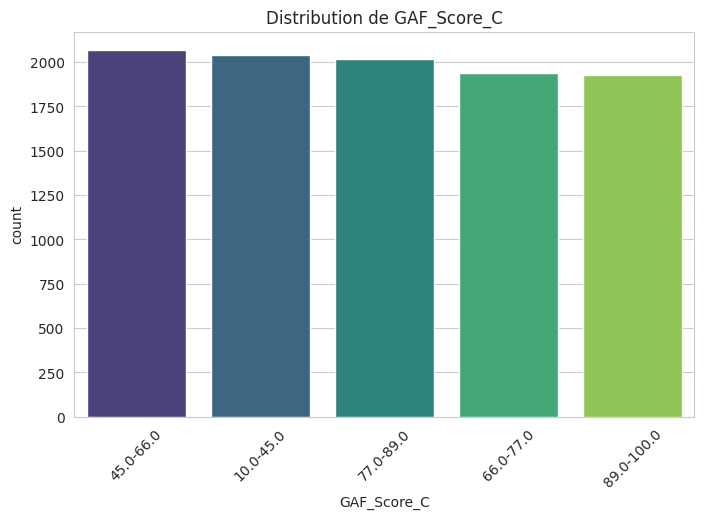

In [ ]:
# Visualisation des distributions pour chaque variable
for col in df.columns:
    plt.figure(figsize=(8, 5))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index, palette="viridis")
    plt.title(f"Distribution de {col}")
    plt.xticks(rotation=45)
    plt.show()

In [ ]:
!pip install prince

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 417.3/417.3 kB 5.8 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import prince
import matplotlib.pyplot as plt
from tabulate import tabulate


# Préparation des données qualitatives
qualitative_vars = df.select_dtypes(include=['category']).columns.tolist()  # Sélectionner les colonnes de type 'category'
print('Variables qualitatives : ', qualitative_vars)
print('Nombre de variables qualitatives :', len(qualitative_vars))

# Compter le nombre de modalités par variable qualitative
modality_counts_per_var = df[qualitative_vars].nunique()
total_modalities = modality_counts_per_var.sum()

# Afficher les résultats
print("\n🔹 Nombre de modalités par variable qualitative :")
print(modality_counts_per_var)
print("Nombre total de modalités :", total_modalities)
print("Nombre total de variables qualitatives :", len(qualitative_vars))


# Transformer les variables catégorielles en codes numériques
mca_data = df[qualitative_vars].apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)
print('MCA Data (Aperçu) :\n', mca_data.head())

# Fréquences et pourcentages pour chaque colonne
for col in mca_data.columns:
    if mca_data[col].dtype == 'object' or mca_data[col].nunique() < 20:
        print(f"\nFréquences et pourcentages pour la variable '{col}' :")

        freq = mca_data[col].value_counts()
        percent = mca_data[col].value_counts(normalize=True) * 100
        cumulative_freq = freq.cumsum()
        cumulative_percent = percent.cumsum()

        freq_table = pd.DataFrame({
            'Modalité': freq.index,
            'Fréquences': freq.values,
            'Pourcentages (%)': percent.values,
            'Fréquences cumulées': cumulative_freq.values,
            'Pourcentages cumulés (%)': cumulative_percent.values
        })

        print(tabulate(freq_table, headers='keys', tablefmt='grid', showindex=False))


Variables qualitatives :  ['Gender', 'Education', 'Marital_Status', 'Occupation', 'Income', 'Residence', 'Diagnosis', 'Family_History', 'Substance_Use', 'Suicide_Attempt', 'Social_Support', 'Stress_Factors', 'Medication_Adherence', 'Age_C', 'Illness_Duration_C', 'Hospitalizations_C', 'Positive_Symptoms_C', 'Negative_Symptoms_C', 'GAF_Score_C']
Nombre de variables qualitatives : 19

🔹 Nombre de modalités par variable qualitative :
Gender                  2
Education               5
Marital_Status          4
Occupation              4
Income                  3
Residence               2
Diagnosis               2
Family_History          2
Substance_Use           2
Suicide_Attempt         2
Social_Support          3
Stress_Factors          3
Medication_Adherence    3
Age_C                   3
Illness_Duration_C      3
Hospitalizations_C      3
Positive_Symptoms_C     5
Negative_Symptoms_C     5
GAF_Score_C             5
dtype: int64
Nombre total de modalités : 61
Nombre total de variables qu

In [ ]:
# Tri à plat : Fréquence des modalités par variable
print("\n🔹 Tri à plat (fréquences des modalités) :")
for col in df.columns:
    print(f"\n📊 Variable : {col}")
    print(df[col].value_counts(dropna=False))  # Inclut les NaN


🔹 Tri à plat (fréquences des modalités) :

📊 Variable : Gender
Gender
1    5026
0    4974
Name: count, dtype: int64

📊 Variable : Education
Education
5    2143
3    1995
4    1973
2    1945
1    1944
Name: count, dtype: int64

📊 Variable : Marital_Status
Marital_Status
3    2569
1    2539
2    2468
0    2424
Name: count, dtype: int64

📊 Variable : Occupation
Occupation
1    2566
3    2528
2    2478
0    2428
Name: count, dtype: int64

📊 Variable : Income
Income
0    3357
2    3326
1    3317
Name: count, dtype: int64

📊 Variable : Residence
Residence
0    5006
1    4994
Name: count, dtype: int64

📊 Variable : Diagnosis
Diagnosis
0    7113
1    2887
Name: count, dtype: int64

📊 Variable : Family_History
Family_History
0    6804
1    3196
Name: count, dtype: int64

📊 Variable : Substance_Use
Substance_Use
0    7823
1    2177
Name: count, dtype: int64

📊 Variable : Suicide_Attempt
Suicide_Attempt
0    9116
1     884
Name: count, dtype: int64

📊 Variable : Social_Support
Social_Support
1  

# Analyse bidimensionnelle

In [ ]:
# TABLEAU DISJONCTIF
# One-hot encoding for categorical features
df_encoded = pd.get_dummies(df, columns=df.select_dtypes(include=['category']).columns, drop_first=False)
# Replace True/False with 1/0 in the DataFrame
df_bin = df_encoded.replace({True: 1, False: 0})


print(df_bin.head())


<ipython-input-16-31a0fe56aaa6>:8: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_bin = df_encoded.replace({True: 1, False: 0})


   Gender_0  Gender_1  Education_1  Education_2  Education_3  Education_4  \
0         0         1            0            0            0            1   
1         0         1            0            0            0            0   
2         0         1            0            0            0            0   
3         0         1            0            0            1            0   
4         1         0            1            0            0            0   

   Education_5  Marital_Status_0  Marital_Status_1  Marital_Status_2  ...  \
0            0                 0                 0                 1  ...   
1            1                 0                 0                 1  ...   
2            1                 0                 0                 0  ...   
3            0                 0                 0                 1  ...   
4            0                 0                 0                 1  ...   

   Negative_Symptoms_C_0.0-14.0  Negative_Symptoms_C_14.0-28.0  \
0       

In [ ]:
import pandas as pd

# Assuming df_bin is already defined as the disjunctive table (one-hot encoded DataFrame)

def create_burt_table(df_bin):

    burt_table = df_bin.T @ df_bin  # Matrix multiplication for Burt table
    return burt_table

# Example usage (replace with your actual df_bin):
burt_table = create_burt_table(df_bin)


burt_table


,Gender_0,Gender_1,Education_1,Education_2,Education_3,Education_4,Education_5,Marital_Status_0,Marital_Status_1,Marital_Status_2,...,Negative_Symptoms_C_0.0-14.0,Negative_Symptoms_C_14.0-28.0,Negative_Symptoms_C_28.0-42.0,Negative_Symptoms_C_42.0-65.0,Negative_Symptoms_C_65.0-100.0,GAF_Score_C_10.0-45.0,GAF_Score_C_45.0-66.0,GAF_Score_C_66.0-77.0,GAF_Score_C_77.0-89.0,GAF_Score_C_89.0-100.0
Gender_0,4974,0,962,988,1017,964,1043,1208,1266,1222,...,1013,1002,1018,961,980,999,1037,972,1033,933
Gender_1,0,5026,982,957,978,1009,1100,1216,1273,1246,...,1009,1024,1029,952,1012,1041,1032,969,987,997
Education_1,962,982,1944,0,0,0,0,448,489,479,...,384,395,411,365,389,408,413,417,350,356
Education_2,988,957,0,1945,0,0,0,473,496,470,...,408,391,398,354,394,395,395,356,400,399
Education_3,1017,978,0,0,1995,0,0,500,521,497,...,403,397,408,409,378,407,381,405,417,385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAF_Score_C_10.0-45.0,999,1041,408,395,407,412,418,497,507,528,...,0,0,0,649,1391,2040,0,0,0,0
GAF_Score_C_45.0-66.0,1037,1032,413,395,381,409,471,484,519,498,...,343,354,362,409,601,0,2069,0,0,0
GAF_Score_C_66.0-77.0,972,969,417,356,405,364,399,473,479,482,...,564,527,565,285,0,0,0,1941,0,0
GAF_Score_C_77.0-89.0,1033,987,350,400,417,407,446,506,550,445,...,560,580,578,302,0,0,0,0,2020,0


In [ ]:
pip install prince scikit-learn matplotlib seaborn pandas numpy

In [ ]:
print(df.columns)

Index(['Gender', 'Education', 'Marital_Status', 'Occupation', 'Income',
       'Residence', 'Diagnosis', 'Family_History', 'Substance_Use',
       'Suicide_Attempt', 'Social_Support', 'Stress_Factors',
       'Medication_Adherence', 'Age_C', 'Illness_Duration_C',
       'Hospitalizations_C', 'Positive_Symptoms_C', 'Negative_Symptoms_C',
       'GAF_Score_C'],
      dtype='object')


In [ ]:
print(df['Gender'].head())

0    1
1    1
2    1
3    1
4    0
Name: Gender, dtype: category
Categories (2, int64): [0, 1]


In [ ]:
import itertools

# Tri croisé entre toutes les variables catégorielles
print("\n🔹 Tri croisé entre toutes les variables :")
for var1, var2 in itertools.combinations(df.columns, 2):  # Paires de variables
    print(f"\n📊 Tri croisé entre {var1} et {var2}")
    print(pd.crosstab(df[var1], df[var2], margins=True))  # Ajoute total des lignes et colonnes


🔹 Tri croisé entre toutes les variables :

📊 Tri croisé entre Gender et Education
Education     1     2     3     4     5    All
Gender                                        
0           962   988  1017   964  1043   4974
1           982   957   978  1009  1100   5026
All        1944  1945  1995  1973  2143  10000

📊 Tri croisé entre Gender et Marital_Status
Marital_Status     0     1     2     3    All
Gender                                       
0               1208  1266  1222  1278   4974
1               1216  1273  1246  1291   5026
All             2424  2539  2468  2569  10000

📊 Tri croisé entre Gender et Occupation
Occupation     0     1     2     3    All
Gender                                   
0           1210  1283  1240  1241   4974
1           1218  1283  1238  1287   5026
All         2428  2566  2478  2528  10000

📊 Tri croisé entre Gender et Income
Income     0     1     2    All
Gender                         
0       1647  1678  1649   4974
1       1710  1639  167

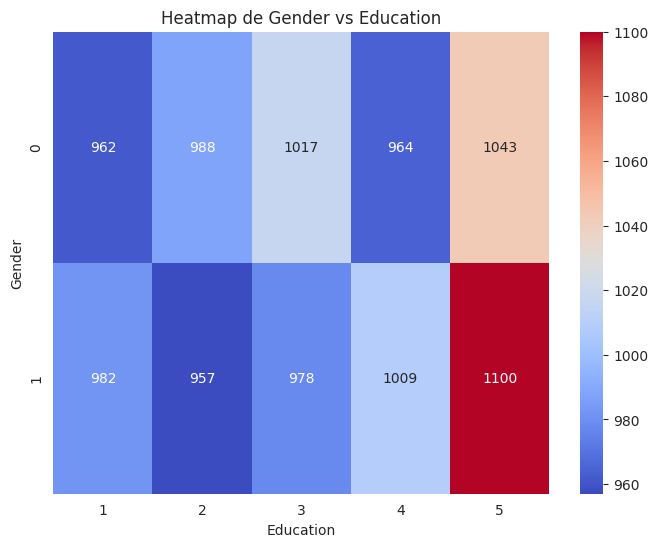

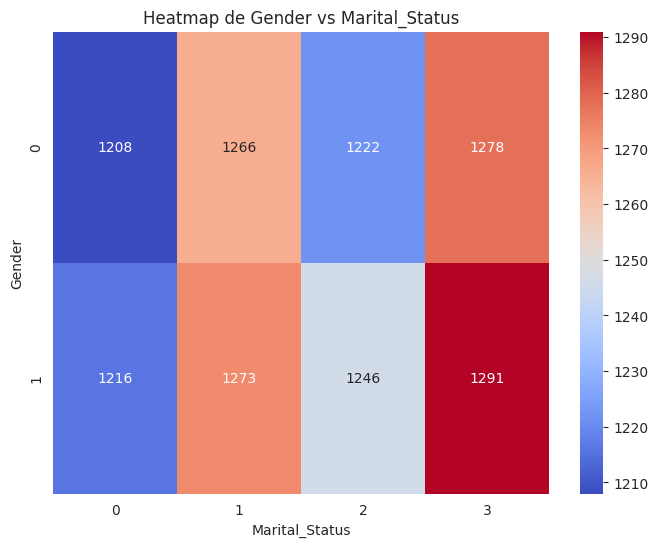

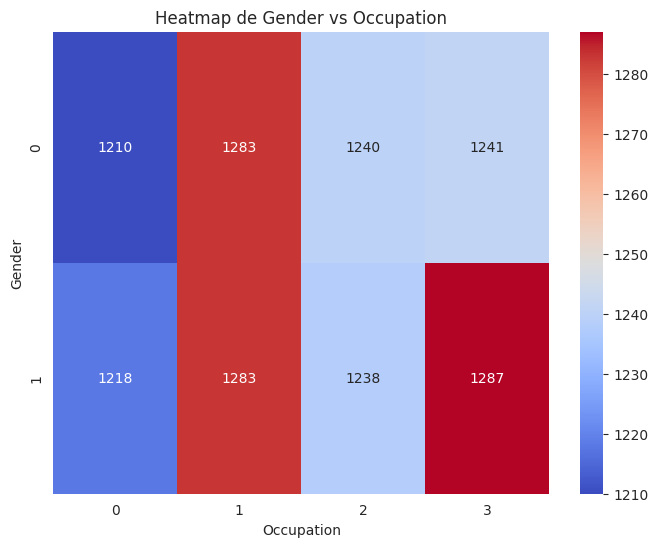

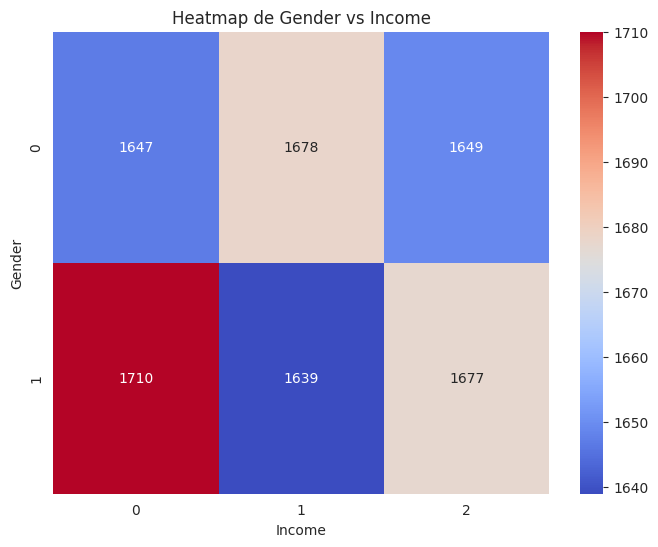

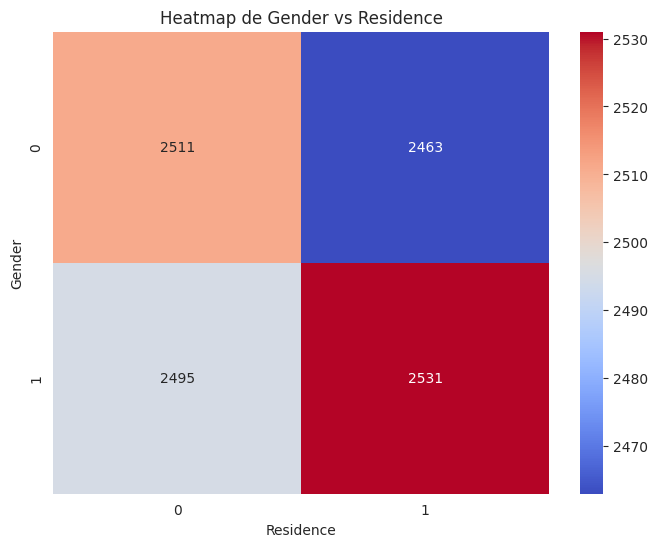

...

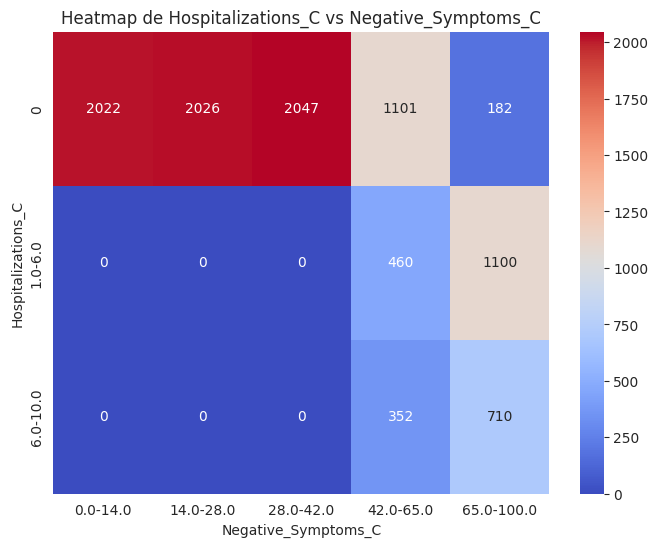

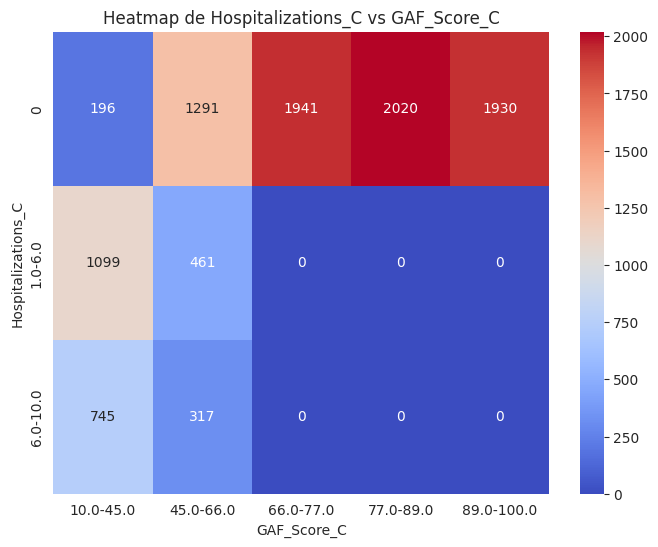

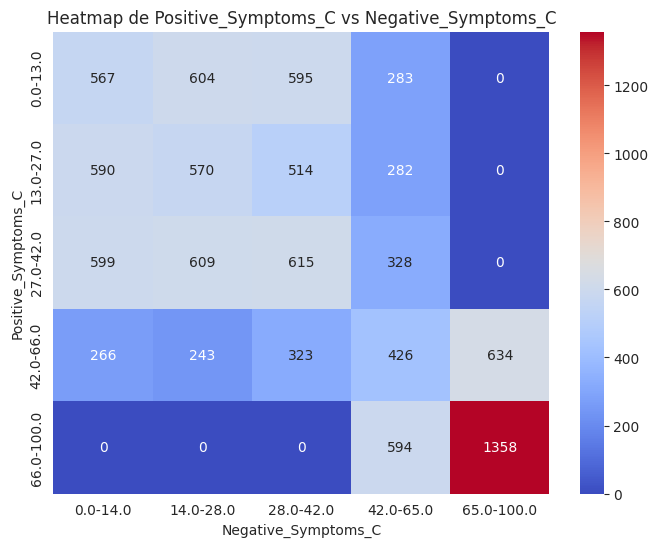

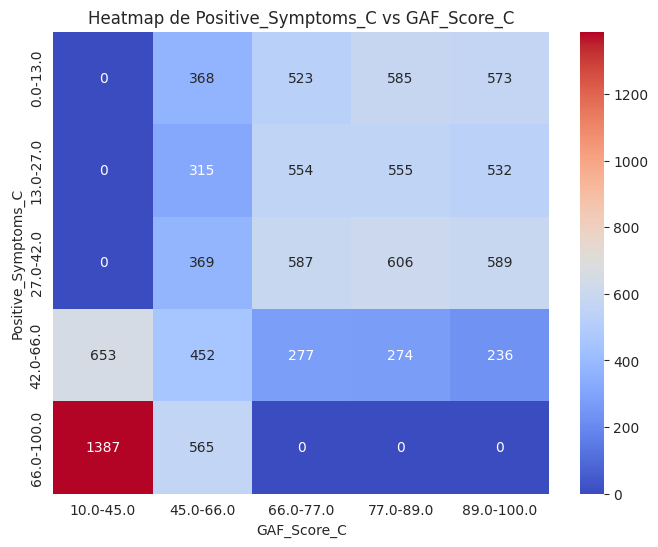

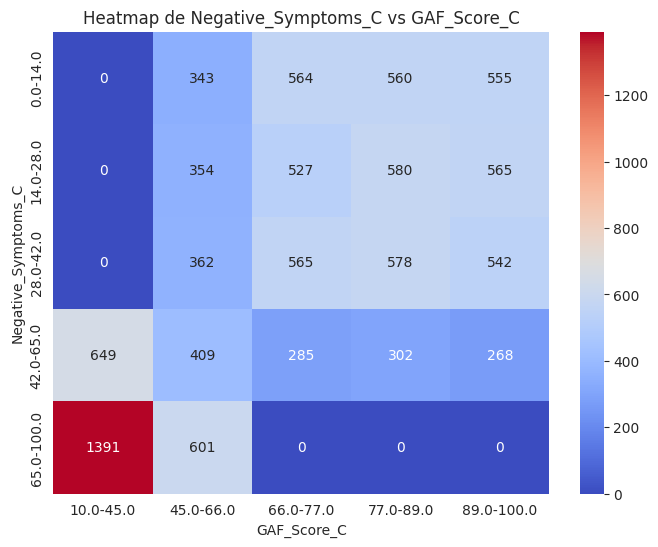

In [ ]:
# ✅ 5. Heatmap des relations entre toutes les paires de variables catégorielles
for var1, var2 in itertools.combinations(df.columns, 2):
    cross_tab = pd.crosstab(df[var1], df[var2])
    plt.figure(figsize=(8, 6))
    sns.heatmap(cross_tab, annot=True, cmap="coolwarm", fmt="d")
    plt.title(f"Heatmap de {var1} vs {var2}")
    plt.show()


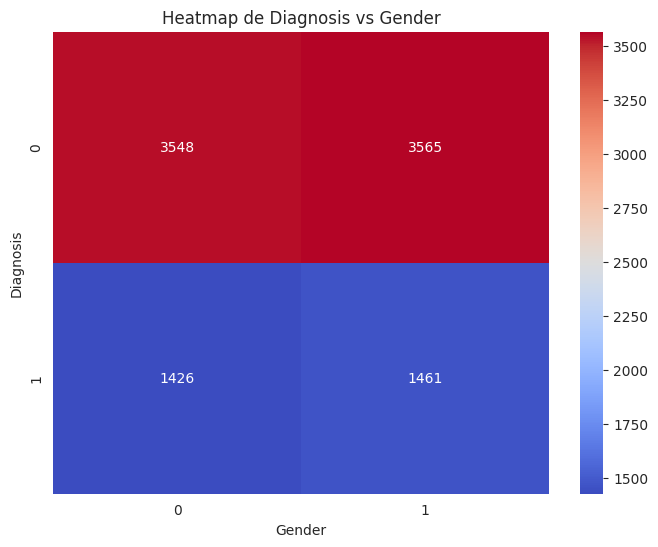

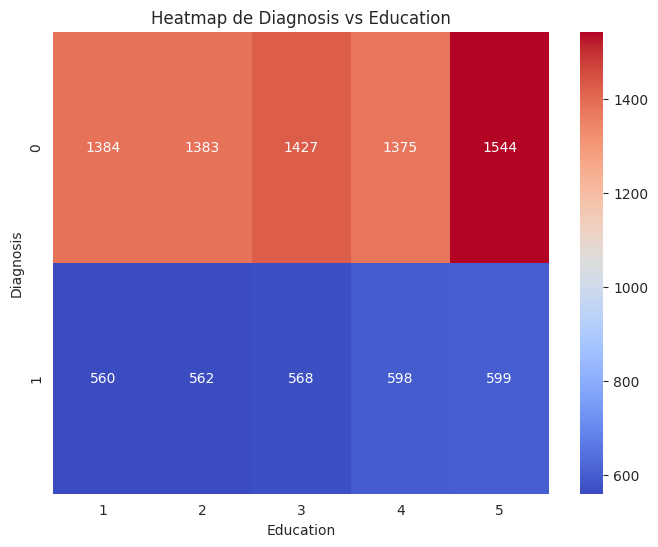

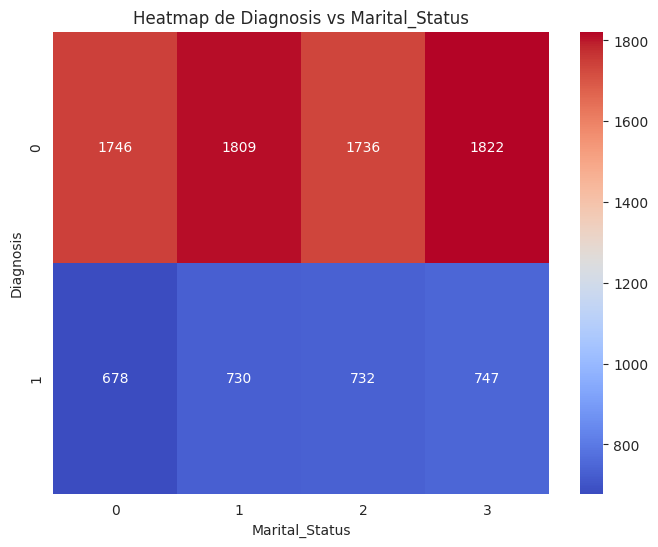

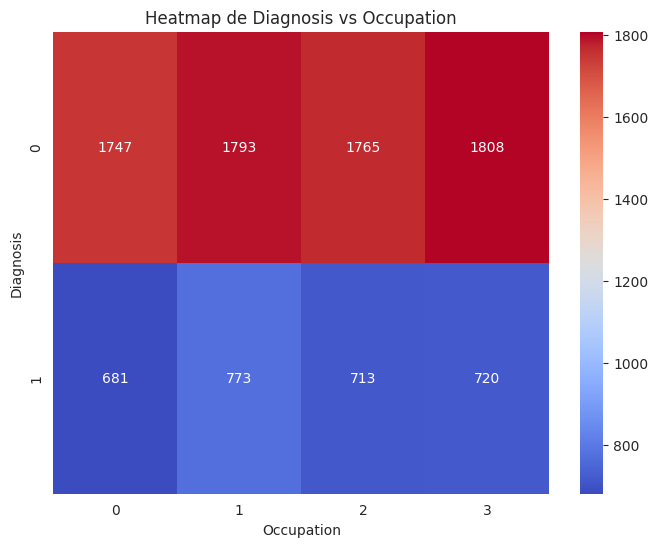

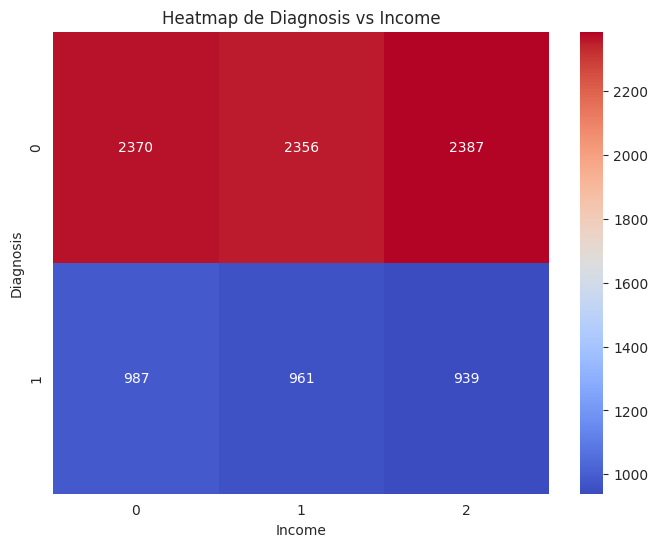

...

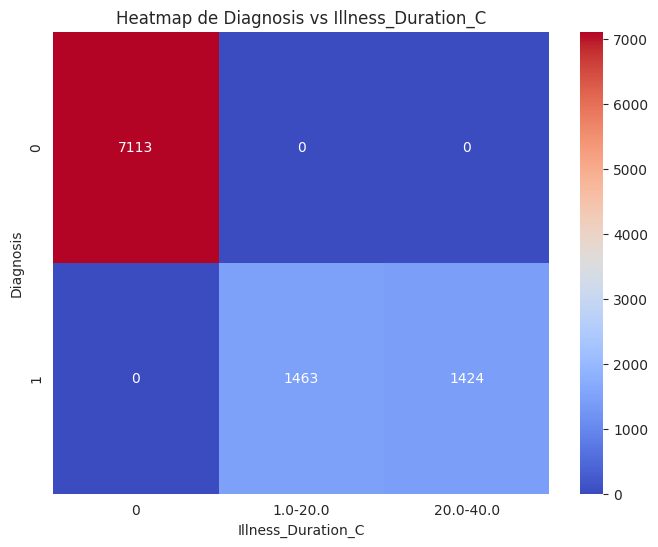

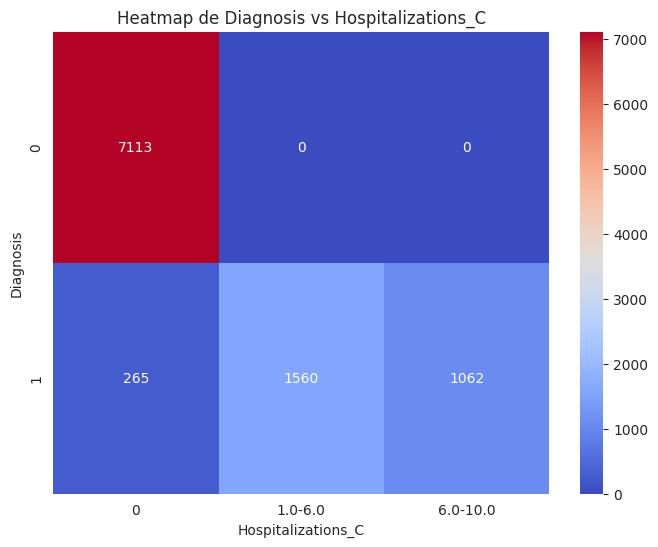

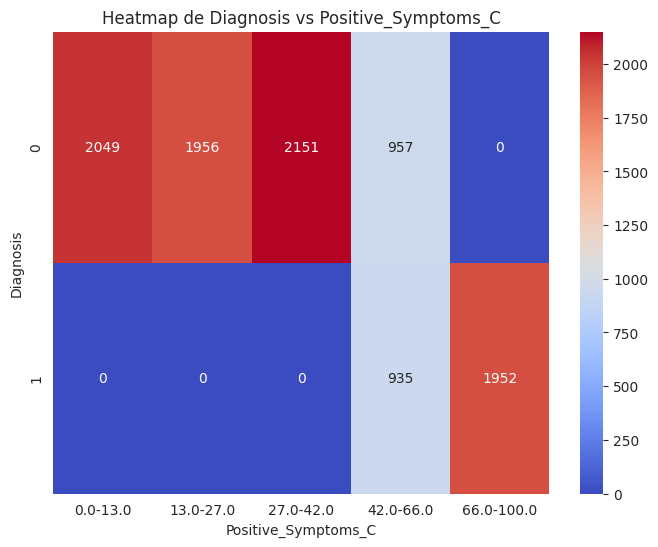

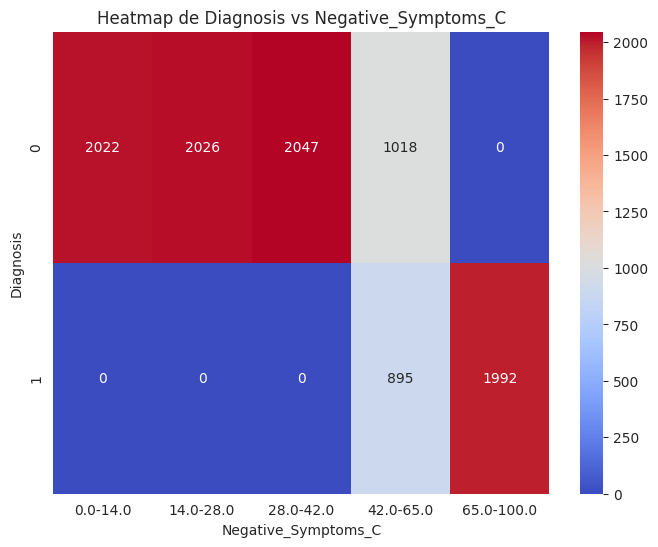

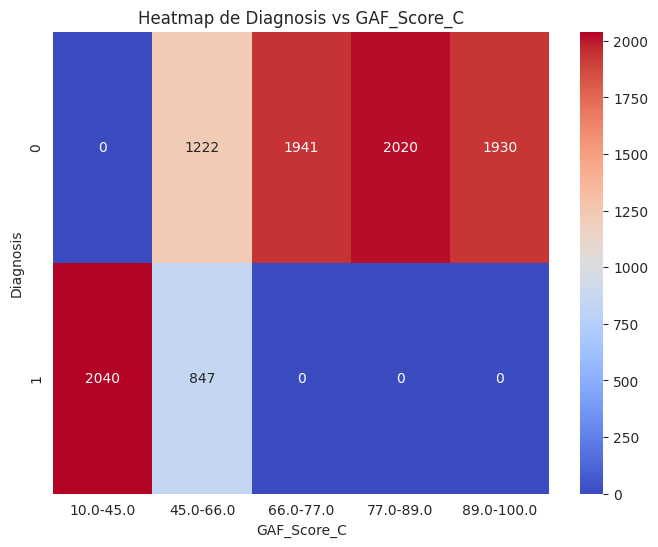

In [ ]:

for col in df.columns:
    if col != 'Diagnosis':  # Avoid comparing a variable to itself
        cross_tab = pd.crosstab(df['Diagnosis'], df[col])
        plt.figure(figsize=(8, 6))
        sns.heatmap(cross_tab, annot=True, cmap="coolwarm", fmt="d")
        plt.title(f"Heatmap de Diagnosis vs {col}")
        plt.show()


In [ ]:
from tabulate import tabulate
import pandas as pd
from tabulate import tabulate

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
from IPython.display import display, HTML

def cramers_v(confusion_matrix):
    """ calculate Cramers V statistic for categorial-categorial association.
    """
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Assuming df_bin is your disjunctive table (one-hot encoded DataFrame)
cramers_v_matrix = pd.DataFrame(index=df_bin.columns, columns=df_bin.columns)

for col1 in df_bin.columns:
    for col2 in df_bin.columns:
        confusion_matrix = pd.crosstab(df_bin[col1], df_bin[col2])
        cramers_v_matrix.loc[col1, col2] = cramers_v(confusion_matrix)

# --- Highlight values above 0.5 (off-diagonal) in fluorescent yellow ---
def highlight_cells(val):
    color = 'orange' if val > 0.5 else ''  # Exclude diagonal (where val=1)
    return f'background-color: {color}'

# Apply styling
styled_cramers_v = cramers_v_matrix.style.applymap(highlight_cells)

# --- Display without truncation ---
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    # Use .to_html() instead of .render() if using pandas version < 1.3.0
    display(HTML(styled_cramers_v.to_html()))  # Use to_html() for older pandas versions

<ipython-input-25-4890b9da3905>:32: FutureWarning: Styler.applymap has been deprecated. Use Styler.map instead.
  styled_cramers_v = cramers_v_matrix.style.applymap(highlight_cells)


,Gender_0,Gender_1,Education_1,Education_2,Education_3,Education_4,Education_5,Marital_Status_0,Marital_Status_1,Marital_Status_2,Marital_Status_3,Occupation_0,Occupation_1,Occupation_2,Occupation_3,Income_0,Income_1,Income_2,Residence_0,Residence_1,Diagnosis_0,Diagnosis_1,Family_History_0,Family_History_1,Substance_Use_0,Substance_Use_1,Suicide_Attempt_0,Suicide_Attempt_1,Social_Support_0,Social_Support_1,Social_Support_2,Stress_Factors_0,Stress_Factors_1,Stress_Factors_2,Medication_Adherence_0,Medication_Adherence_1,Medication_Adherence_2,Age_C_18.0-38.0,Age_C_38.0-60.0,Age_C_60.0-80.0,Illness_Duration_C_0,Illness_Duration_C_1.0-20.0,Illness_Duration_C_20.0-40.0,Hospitalizations_C_0,Hospitalizations_C_1.0-6.0,Hospitalizations_C_6.0-10.0,Positive_Symptoms_C_0.0-13.0,Positive_Symptoms_C_13.0-27.0,Positive_Symptoms_C_27.0-42.0,Positive_Symptoms_C_42.0-66.0,Positive_Symptoms_C_66.0-100.0,Negative_Symptoms_C_0.0-14.0,Negative_Symptoms_C_14.0-28.0,Negative_Symptoms_C_28.0-42.0,Negative_Symptoms_C_42.0-65.0,Negative_Symptoms_C_65.0-100.0,GAF_Score_C_10.0-45.0,GAF_Score_C_45.0-66.0,GAF_Score_C_66.0-77.0,GAF_Score_C_77.0-89.0,GAF_Score_C_89.0-100.0
Gender_0,0.999800,0.999800,0.000000,0.001644,0.006821,0.000000,0.004415,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006140,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.013391,0.006542,0.009090,0.000000,0.009392,0.000000,0.000000,0.000000,0.000000,0.011406,0.018535,0.000000,0.000000,0.000000,0.018437,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009546,0.008950
Gender_1,0.999800,0.999800,0.000000,0.001644,0.006821,0.000000,0.004415,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.006140,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.013391,0.006542,0.009090,0.000000,0.009392,0.000000,0.000000,0.000000,0.000000,0.011406,0.018535,0.000000,0.000000,0.000000,0.018437,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009546,0.008950
Education_1,0.000000,0.000000,0.999681,0.240873,0.244725,0.243032,0.256059,0.008920,0.000000,0.000000,0.012801,0.000000,0.000000,0.005156,0.000000,0.000000,0.000000,0.002156,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010168,0.010168,0.000000,0.000000,0.000000,0.010954,0.010125,0.011341,0.000000,0.009894,0.000000,0.000000,0.006473,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005276,0.003585,0.017954,0.000000,0.000000,0.020027,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022942,0.024598,0.006575
Education_2,0.001644,0.001644,0.240873,0.999681,0.244803,0.243110,0.256141,0.000000,0.000000,0.000000,0.000000,0.000000,0.003666,0.000000,0.000000,0.005614,0.004780,0.020535,0.000000,0.000000,0.000000,0.000000,0.012204,0.012204,0.000000,0.000000,0.017413,0.017413,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008444,0.025721,0.009307,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012437,0.005539,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005242,0.000000,0.000000,0.000000,0.008965,0.000000,0.010907
Education_3,0.006821,0.006821,0.244725,0.244803,0.999687,0.246997,0.260235,0.000000,0.000000,0.000000,0.017383,0.026863,0.008059,0.000000,0.011779,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010729,0.010729,0.005335,0.005335,0.022961,0.015575,0.000000,0.017393,0.014115,0.000000,0.011945,0.008320,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.018459,0.000000,0.019969,0.000000,0.000000,0.000000,0.000000,0.013855,0.006346,0.000000,0.016524,0.004403,0.000000,0.000000
Education_4,0.000000,0.000000,0.243032,0.

In [ ]:
# --- Trouver les associations fortes et les formater en LaTeX ---
strong_associations = []
threshold = 0.5  # Seuil pour Cramer's V

for col1 in cramers_v_matrix.columns:
    for col2 in cramers_v_matrix.index:
        if col1 != col2 and cramers_v_matrix.loc[col2, col1] > threshold:
            # --- Modification ici ---
            strong_associations.append(
                f"\\item \\textbf{{{col2}}} et \\textbf{{{col1}}} : {cramers_v_matrix.loc[col2, col1]:.3f}"
            )

# --- Afficher la liste formatée en LaTeX ---
print("\\begin{itemize}")
for item in strong_associations:
    print(item)
print("\\end{itemize}")

\begin{itemize}
\item \textbf{Gender_1} et \textbf{Gender_0} : 1.000
\item \textbf{Gender_0} et \textbf{Gender_1} : 1.000
\item \textbf{Income_1} et \textbf{Income_0} : 0.501
\item \textbf{Income_2} et \textbf{Income_0} : 0.502
\item \textbf{Income_0} et \textbf{Income_1} : 0.501
\item \textbf{Income_0} et \textbf{Income_2} : 0.502
\item \textbf{Residence_1} et \textbf{Residence_0} : 1.000
\item \textbf{Residence_0} et \textbf{Residence_1} : 1.000
\item \textbf{Diagnosis_1} et \textbf{Diagnosis_0} : 1.000
\item \textbf{Illness_Duration_C_0} et \textbf{Diagnosis_0} : 1.000
\item \textbf{Illness_Duration_C_1.0-20.0} et \textbf{Diagnosis_0} : 0.649
\item \textbf{Illness_Duration_C_20.0-40.0} et \textbf{Diagnosis_0} : 0.639
\item \textbf{Hospitalizations_C_0} et \textbf{Diagnosis_0} : 0.935
\item \textbf{Hospitalizations_C_1.0-6.0} et \textbf{Diagnosis_0} : 0.674
\item \textbf{Hospitalizations_C_6.0-10.0} et \textbf{Diagnosis_0} : 0.541
\item \textbf{Positive_Symptoms_C_66.0-100.0} et \tex

# ACM des modalités avec Diagnosis/ Illness_Duration_C/ Hospitalizations_C en supplémentaires

## Projection des variables supplémentaires dans le plan de l'ACM

Variables actives utilisées pour l’ACM : ['Gender', 'Education', 'Marital_Status', 'Occupation', 'Income', 'Residence', 'Family_History', 'Substance_Use', 'Suicide_Attempt', 'Social_Support', 'Stress_Factors', 'Medication_Adherence', 'Age_C', 'Positive_Symptoms_C', 'Negative_Symptoms_C', 'GAF_Score_C']
Aperçu des données pour l’ACM :
    Gender  Education  Marital_Status  Occupation  Income  Residence  \
0       1          3               2           0       2          1   
1       1          4               2           2       1          0   
2       1          4               3           2       1          0   
3       1          2               2           0       2          0   
4       0          0               2           0       2          1   

   Family_History  Substance_Use  Suicide_Attempt  Social_Support  \
0               0              0                0               0   
1               1              1                1               2   
2               1            

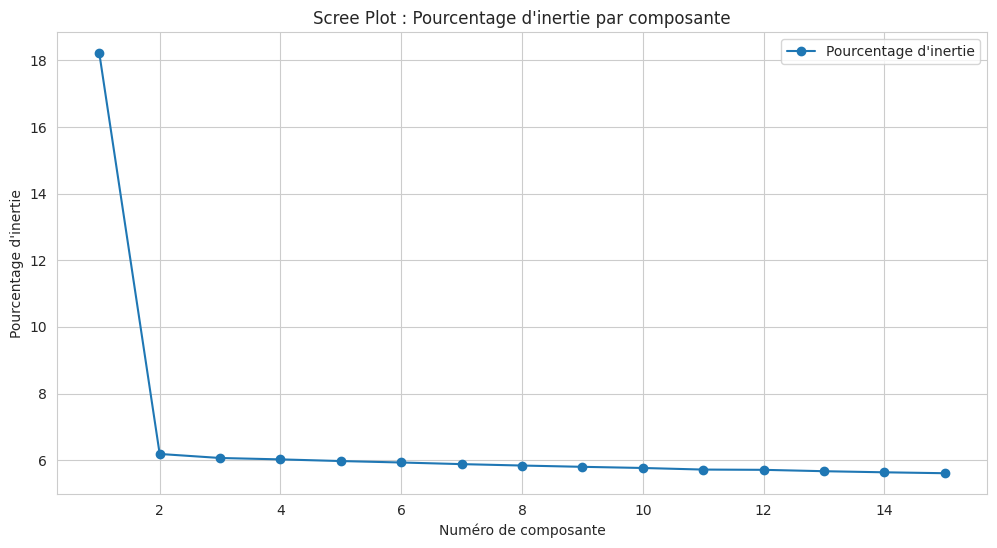

Baseline Kaiser (inertie attendue) : 0.0625
Nombre de composantes retenues par Kaiser : 15

Contributions cumulées par variable active (vecteur par dimension) :
                Variable    CTR_Dim1    CTR_Dim2     CTR_cum
0                  Age_C    0.000000    0.000000    0.000000
1              Education    0.166031  107.104901  107.270932
2         Family_History  122.298764    0.704066  123.002830
3            GAF_Score_C    0.000000    0.000000    0.000000
4                 Gender    0.087211  123.569138  123.656349
5                 Income    0.080642   11.778694   11.859336
6         Marital_Status    0.115453  104.338899  104.454351
7   Medication_Adherence   95.483579   89.345249  184.828829
8    Negative_Symptoms_C    0.000000    0.000000    0.000000
9             Occupation    0.297446  158.025195  158.322641
10   Positive_Symptoms_C    0.000000    0.000000    0.000000
11             Residence    0.541244    0.042302    0.583546
12        Social_Support    0.012165  163.7674

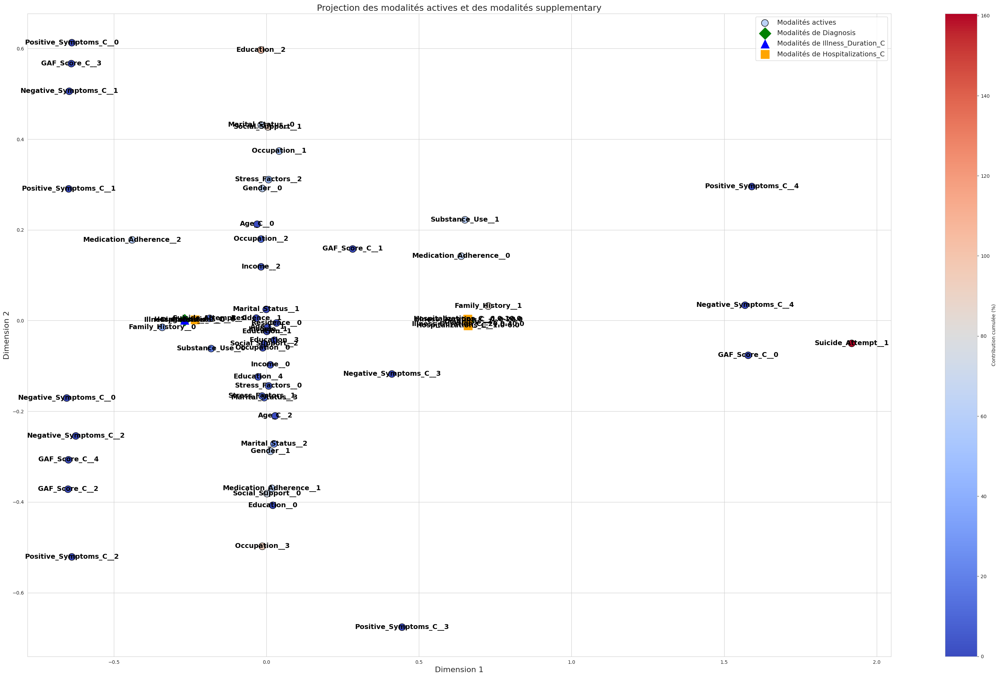

In [ ]:
import pandas as pd
import numpy as np
import prince
import matplotlib.pyplot as plt

# ------------------------- Préparation des données -------------------------
# Variables supplementary (cibles)
supp_vars = ['Diagnosis', 'Illness_Duration_C', 'Hospitalizations_C']
df_supp = df[supp_vars]
# Jeu de données actif : on retire les variables supplementary
df_mca = df.drop(columns=supp_vars)

# Sélection des variables actives (colonnes de type 'category')
qualitative_vars = df_mca.select_dtypes(include=['category']).columns.tolist()
print("Variables actives utilisées pour l’ACM :", qualitative_vars)

# Transformation en codes numériques pour l'ACM
mca_data = df_mca[qualitative_vars].apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)
print("Aperçu des données pour l’ACM :\n", mca_data.head())

# ----------------- Étape 1 : Justification du choix des dimensions -----------------
max_components = min(mca_data.shape) - 1
mca_full = prince.MCA(n_components=max_components, random_state=42).fit(mca_data)

eigenvalues = np.array(mca_full.eigenvalues_)
total_inertia = eigenvalues.sum()
percent_inertia = 100 * eigenvalues / total_inertia
cumulative_percent = np.cumsum(percent_inertia)

print("Valeurs propres :", eigenvalues)
print("Pourcentage d'inertie par composante :", percent_inertia)
print("Inertie cumulée (%) :", cumulative_percent)

plt.figure(figsize=(12, 6))
plt.plot(range(1, len(percent_inertia) + 1), percent_inertia, marker='o', label="Pourcentage d'inertie")
plt.xlabel('Numéro de composante')
plt.ylabel("Pourcentage d'inertie")
plt.title("Scree Plot : Pourcentage d'inertie par composante")
plt.grid(True)
plt.legend()
plt.show()

baseline = 1 / len(qualitative_vars)
num_components_kaiser = np.sum(eigenvalues > baseline)
print("Baseline Kaiser (inertie attendue) :", baseline)
print("Nombre de composantes retenues par Kaiser :", num_components_kaiser)

# ----------------- Étape 2 : Réalisation de l'ACM et calcul des contributions -----------------
selected_components = 2
mca = prince.MCA(n_components=selected_components, random_state=42).fit(mca_data)

# Coordonnées des modalités actives sur les dimensions retenues
df_coordinates = mca.column_coordinates(mca_data).rename(columns={0: 'Dim1', 1: 'Dim2'})
df_coordinates['Modalité'] = df_coordinates.index

# Calcul du poids (masse) des modalités
# Construction d'une table de fréquences avec le séparateur '__' pour correspondre aux modalités (format "Variable__Catégorie")
freq_table = {}
for col in qualitative_vars:
    cat_counts = df_mca[col].value_counts(dropna=False)
    for cat, count in cat_counts.items():
        freq_table[f"{col}__{cat}"] = count
freq_series = pd.Series(freq_table)
N = df_mca.shape[0]
freq_series = freq_series.reindex(df_coordinates.index, fill_value=0)
mass = freq_series / N
df_coordinates['Poids'] = mass

# Calcul des contributions par dimension pour chaque modalité
eigenvalues_selected = np.array(mca.eigenvalues_[:selected_components])
for i in range(selected_components):
    dim = f"Dim{i+1}"
    ctr = (df_coordinates['Poids'] * (df_coordinates[dim]**2) / eigenvalues_selected[i]) * 100
    df_coordinates[f"CTR_{dim}"] = ctr

# Contribution cumulée par modalité (somme des contributions sur les dimensions)
df_coordinates['CTR_cum'] = df_coordinates[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)

# ----------------- Regroupement des contributions par variable active -----------------
# Format attendu pour les modalités : "Variable__Catégorie"
df_coordinates['Variable'] = df_coordinates['Modalité'].apply(lambda x: x.split('__')[0])
df_var_contrib = df_coordinates.groupby('Variable')[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum().reset_index()
df_var_contrib['CTR_cum'] = df_var_contrib[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)

print("\nContributions cumulées par variable active (vecteur par dimension) :")
print(df_var_contrib)

# ----------------- Étape 3 : Projection supplementary des variables cibles -----------------
row_coords = mca.row_coordinates(mca_data).rename(columns={0: 'Dim1', 1: 'Dim2'}).reset_index(drop=True)

# Pour chaque variable supplementary, calcul du barycentre et stockage du nombre d'observations (Count)
supp_coords_all = pd.DataFrame()
for supp in supp_vars:
    supp_dummies = pd.get_dummies(df_supp[supp], prefix=supp, prefix_sep='__')
    # Calcul des coordonnées barycentriques
    coords = supp_dummies.T.dot(row_coords[['Dim1', 'Dim2']])
    # Récupération des comptes par modalité
    counts = supp_dummies.sum(axis=0)
    coords = coords.divide(counts, axis=0)
    # Ajout du nombre d'observations
    coords['Count'] = counts.values
    # Renommage de la colonne d'index en "Modalité"
    coords = coords.reset_index().rename(columns={'index': 'Modalité'})
    coords['Variable'] = supp
    supp_coords_all = pd.concat([supp_coords_all, coords], ignore_index=True)

# ----------------- Calcul des valeurs test pour les variables supplementary -----------------
# Formule : v_test = coord / sqrt(eigenvalue / Count)
supp_test_vals = supp_coords_all.copy()
supp_test_vals['v_test_Dim1'] = supp_test_vals['Dim1'] / np.sqrt(eigenvalues_selected[0] / supp_test_vals['Count'])
supp_test_vals['v_test_Dim2'] = supp_test_vals['Dim2'] / np.sqrt(eigenvalues_selected[1] / supp_test_vals['Count'])

# ----------------- Affichage sous forme de tableau des valeurs test supplementary -----------------
print("\nTableau des valeurs test pour les variables supplementary :")
print(supp_test_vals[['Variable', 'Modalité', 'Count', 'Dim1', 'Dim2', 'v_test_Dim1', 'v_test_Dim2']])

# ----------------- Étape 4 : Tracé du graphique final -----------------
fig, ax = plt.subplots(figsize=(40, 24))

# Modalités actives : colorées selon la contribution cumulée
sc = ax.scatter(
    df_coordinates["Dim1"],
    df_coordinates["Dim2"],
    c=df_coordinates["CTR_cum"],
    cmap="coolwarm",
    edgecolors='black',
    s=200,
    label="Modalités actives"
)
plt.colorbar(sc, label="Contribution cumulée (%)")

for i, row in df_coordinates.iterrows():
    ax.annotate(
        row["Modalité"],
        (row["Dim1"], row["Dim2"]),
        fontsize=14,
        fontweight='bold',
        color='black',
        ha='center',
        va='center'
    )

# Affichage des modalités supplementary pour chaque variable supplementary
markers = {'Diagnosis': 'D', 'Illness_Duration_C': '^', 'Hospitalizations_C': 's'}
colors = {'Diagnosis': 'green', 'Illness_Duration_C': 'blue', 'Hospitalizations_C': 'orange'}

for supp in supp_vars:
    subset = supp_coords_all[supp_coords_all['Variable'] == supp]
    ax.scatter(
        subset["Dim1"],
        subset["Dim2"],
        color=colors[supp], # supp is 'Illness_Duration_C' here
        marker=markers[supp],
        s=300,
        label=f"Modalités de {supp}"
    )
    for i, row in subset.iterrows():
        ax.annotate(
            row['Modalité'],
            (row["Dim1"], row["Dim2"]),
            fontsize=14,
            fontweight='bold',
            color='black',
            ha='center',
            va='center'
        )

ax.set_xlabel("Dimension 1", fontsize=16)
ax.set_ylabel("Dimension 2", fontsize=16)
ax.set_title("Projection des modalités actives et des modalités supplementary", fontsize=18)
ax.legend(fontsize=14)
ax.grid(True)
plt.show()


Variables actives utilisées pour l’ACM : ['Gender', 'Education', 'Marital_Status', 'Occupation', 'Income', 'Residence', 'Family_History', 'Substance_Use', 'Suicide_Attempt', 'Social_Support', 'Stress_Factors', 'Medication_Adherence', 'Age_C', 'Positive_Symptoms_C', 'Negative_Symptoms_C', 'GAF_Score_C']


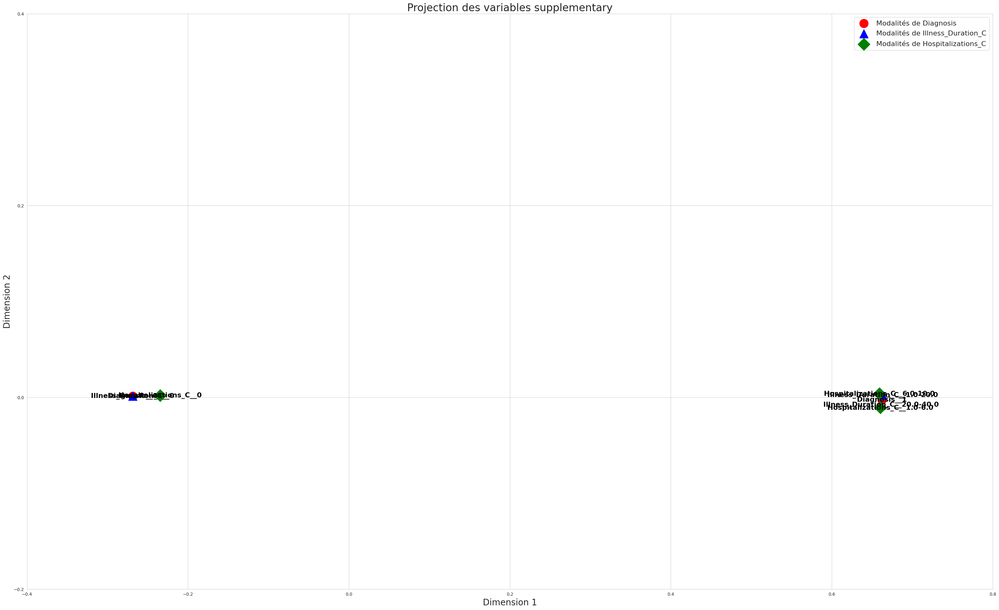

In [ ]:
import pandas as pd
import numpy as np
import prince
import matplotlib.pyplot as plt

# ------------------------- Préparation des données -------------------------
# Variables supplementary (cibles)
supp_vars = ['Diagnosis', 'Illness_Duration_C', 'Hospitalizations_C']
df_supp = df[supp_vars]
# Jeu de données actif : on retire les variables supplementary
df_mca = df.drop(columns=supp_vars)

# Sélection des variables actives (colonnes de type 'category')
qualitative_vars = df_mca.select_dtypes(include=['category']).columns.tolist()
print("Variables actives utilisées pour l’ACM :", qualitative_vars)

# Transformation en codes numériques pour l'ACM
mca_data = df_mca[qualitative_vars].apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)


# ----------------- Étape 2 : Réalisation de l'ACM et calcul des contributions -----------------
selected_components = 2
mca = prince.MCA(n_components=selected_components, random_state=42).fit(mca_data)

# Coordonnées des modalités actives sur les dimensions retenues
df_coordinates = mca.column_coordinates(mca_data).rename(columns={0: 'Dim1', 1: 'Dim2'})
df_coordinates['Modalité'] = df_coordinates.index

# Calcul du poids (masse) des modalités
# Construction d'une table de fréquences avec le format "Variable__Catégorie"
freq_table = {}
for col in qualitative_vars:
    cat_counts = df_mca[col].value_counts(dropna=False)
    for cat, count in cat_counts.items():
        freq_table[f"{col}__{cat}"] = count
freq_series = pd.Series(freq_table)
N = df_mca.shape[0]
freq_series = freq_series.reindex(df_coordinates.index, fill_value=0)
mass = freq_series / N
df_coordinates['Poids'] = mass

# Calcul des contributions par dimension pour chaque modalité
eigenvalues_selected = np.array(mca.eigenvalues_[:selected_components])
for i in range(selected_components):
    dim = f"Dim{i+1}"
    ctr = (df_coordinates['Poids'] * (df_coordinates[dim]**2) / eigenvalues_selected[i]) * 100
    df_coordinates[f"CTR_{dim}"] = ctr

# Contribution cumulée par modalité (somme des contributions sur les dimensions)
df_coordinates['CTR_cum'] = df_coordinates[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)

# ----------------- Étape 3 : Projection supplementary des variables cibles -----------------
# Récupération des coordonnées des individus issues de l'ACM
row_coords = mca.row_coordinates(mca_data).rename(columns={0: 'Dim1', 1: 'Dim2'}).reset_index(drop=True)
supp_coords_all = pd.DataFrame()
# Itération sur chacune des variables supplementary
for supp in supp_vars:
    supp_dummies = pd.get_dummies(df_supp[supp], prefix=supp, prefix_sep='__')
    coords = supp_dummies.T.dot(row_coords[['Dim1', 'Dim2']])
    counts = supp_dummies.sum(axis=0)
    coords = coords.divide(counts, axis=0)
    coords['Count'] = counts.values
    coords = coords.reset_index().rename(columns={'index': 'Modalité'})
    coords['Variable'] = supp
    supp_coords_all = pd.concat([supp_coords_all, coords], ignore_index=True)

# Calcul des valeurs test pour chaque variable supplementary
supp_test_vals = supp_coords_all.copy()
supp_test_vals['v_test_Dim1'] = supp_test_vals['Dim1'] / np.sqrt(eigenvalues_selected[0] / supp_test_vals['Count'])
supp_test_vals['v_test_Dim2'] = supp_test_vals['Dim2'] / np.sqrt(eigenvalues_selected[1] / supp_test_vals['Count'])

# ----------------- Étape 4 : Tracé du graphique final (seulement variables supplementary) -----------------
fig, ax = plt.subplots(figsize=(40, 24))

# Définition des marqueurs et couleurs pour chacune des variables supplementary
markers = {'Diagnosis': 'o', 'Illness_Duration_C': '^', 'Hospitalizations_C': 'D'}
colors = {'Diagnosis': 'red', 'Illness_Duration_C': 'blue', 'Hospitalizations_C': 'green'}

# Affichage des modalités supplementary pour chacune des 3 variables
for supp in supp_vars:
    subset = supp_coords_all[supp_coords_all['Variable'] == supp]
    ax.scatter(
        subset["Dim1"],
        subset["Dim2"],
        color=colors[supp],
        marker=markers[supp],
        s=400,
        label=f"Modalités de {supp}"
    )
    for i, row in subset.iterrows():
        ax.annotate(
            row['Modalité'],
            (row["Dim1"], row["Dim2"]),
            fontsize=16,
            fontweight='bold',
            color='black',
            ha='center',
            va='center'
        )

# Définition du pas des graduations en abscisses et ordonnées à 0.2
x_min, x_max = ax.get_xlim()
y_min, y_max = ax.get_ylim()
# On arrondit légèrement pour couvrir toute l'étendue
ax.set_xticks(np.arange(np.floor(x_min*5)/5, np.ceil(x_max*5)/5 + 0.2, 0.2))
ax.set_yticks(np.arange(np.floor(y_min*5)/5, np.ceil(y_max*5)/5 + 0.2, 0.2))

ax.set_xlabel("Dimension 1", fontsize=20)
ax.set_ylabel("Dimension 2", fontsize=20)
ax.set_title("Projection des variables supplementary", fontsize=24)
ax.legend(fontsize=16)
ax.grid(True)
plt.show()


Variables actives utilisées pour l’ACM : ['Gender', 'Education', 'Marital_Status', 'Occupation', 'Income', 'Residence', 'Family_History', 'Substance_Use', 'Suicide_Attempt', 'Social_Support', 'Stress_Factors', 'Medication_Adherence', 'Age_C', 'Positive_Symptoms_C', 'Negative_Symptoms_C', 'GAF_Score_C']
Nombre de modalités filtrées = 24


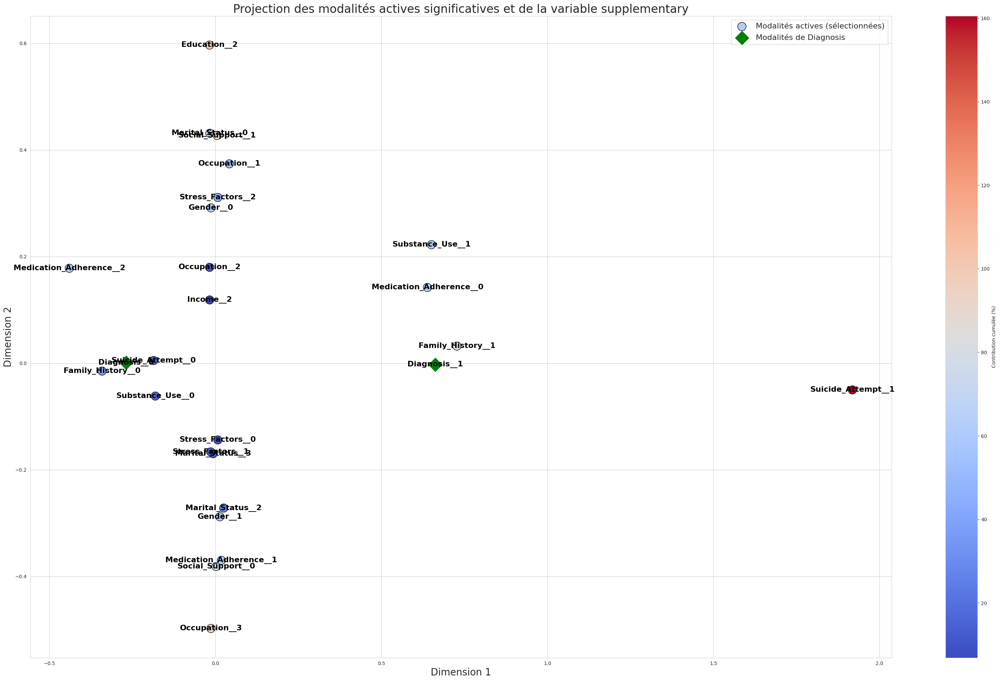

In [ ]:
import pandas as pd
import numpy as np
import prince
import matplotlib.pyplot as plt

# ------------------------- Préparation des données -------------------------
# Variables supplementary (cible)
supp_vars = ['Diagnosis', 'Illness_Duration_C', 'Hospitalizations_C']
df_supp = df[supp_vars]
# Jeu de données actif : on retire la variable supplementary
df_mca = df.drop(columns=supp_vars)

# Sélection des variables actives (colonnes de type 'category')
qualitative_vars = df_mca.select_dtypes(include=['category']).columns.tolist()
print("Variables actives utilisées pour l’ACM :", qualitative_vars)

# Transformation en codes numériques pour l'ACM
mca_data = df_mca[qualitative_vars].apply(lambda x: x.cat.codes if x.dtype.name == 'category' else x)


# ----------------- Étape 2 : Réalisation de l'ACM et calcul des contributions -----------------
selected_components = 2
mca = prince.MCA(n_components=selected_components, random_state=42).fit(mca_data)

# Coordonnées des modalités actives sur les dimensions retenues
df_coordinates = mca.column_coordinates(mca_data).rename(columns={0: 'Dim1', 1: 'Dim2'})
df_coordinates['Modalité'] = df_coordinates.index

# Calcul du poids (masse) des modalités
# On construit une table de fréquences en utilisant le format "Variable__Catégorie"
freq_table = {}
for col in qualitative_vars:
    cat_counts = df_mca[col].value_counts(dropna=False)
    for cat, count in cat_counts.items():
        freq_table[f"{col}__{cat}"] = count
freq_series = pd.Series(freq_table)
N = df_mca.shape[0]
freq_series = freq_series.reindex(df_coordinates.index, fill_value=0)
mass = freq_series / N
df_coordinates['Poids'] = mass


# Calcul des contributions et cos²
eigenvalues_selected = np.array(mca.eigenvalues_[:selected_components])
for i in range(selected_components):
    dim = f"Dim{i+1}"
    df_coordinates[f"CTR_{dim}"] = (df_coordinates['Poids'] * (df_coordinates[dim]**2) / eigenvalues_selected[i]) * 100
    df_coordinates[f"cos2_{dim}"] = (df_coordinates[dim]**2) / df_coordinates[[f"Dim{j+1}" for j in range(selected_components)]].pow(2).sum(axis=1)

df_coordinates['CTR_cum'] = df_coordinates[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)

df_coordinates['Variable'] = df_coordinates['Modalité'].apply(lambda x: x.split('__')[0])
df_var_contrib = df_coordinates.groupby('Variable')[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum().reset_index()
df_var_contrib['CTR_cum'] = df_var_contrib[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)


# Contribution cumulée par modalité (somme des contributions sur les dimensions)
df_coordinates['CTR_cum'] = df_coordinates[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)

# Regroupement par variable active (les modalités sont nommées "Variable__Catégorie")
df_coordinates['Variable'] = df_coordinates['Modalité'].apply(lambda x: x.split('__')[0])
df_var_contrib = df_coordinates.groupby('Variable')[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum().reset_index()
df_var_contrib['CTR_cum'] = df_var_contrib[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)


# ----------------- Étape 3 : Projection supplementary de la variable cible -----------------
row_coords = mca.row_coordinates(mca_data).rename(columns={0: 'Dim1', 1: 'Dim2'}).reset_index(drop=True)
supp_coords_all = pd.DataFrame()
supp = 'Diagnosis'
supp_dummies = pd.get_dummies(df_supp[supp], prefix=supp, prefix_sep='__')
# Calcul du barycentre pour chaque modalité
coords = supp_dummies.T.dot(row_coords[['Dim1', 'Dim2']])
# Récupération du nombre d'individus par modalité
counts = supp_dummies.sum(axis=0)
coords = coords.divide(counts, axis=0)
# Ajout du nombre d'observations
coords['Count'] = counts.values
coords = coords.reset_index().rename(columns={'index': 'Modalité'})
coords['Variable'] = supp
supp_coords_all = pd.concat([supp_coords_all, coords], ignore_index=True)

# Calcul des valeurs test pour la variable supplementary
# Formule : v_test = coord / sqrt(eigenvalue / Count)
supp_test_vals = supp_coords_all.copy()
supp_test_vals['v_test_Dim1'] = supp_test_vals['Dim1'] / np.sqrt(eigenvalues_selected[0] / supp_test_vals['Count'])
supp_test_vals['v_test_Dim2'] = supp_test_vals['Dim2'] / np.sqrt(eigenvalues_selected[1] / supp_test_vals['Count'])



# ----------------- Filtrage des modalités actives par contribution significative -----------------
# Calcul du seuil moyen attendu (p_rel) :
# p_rel = 100 / nombre total de modalités (car la somme des contributions par dimension vaut 100)
n_modalities = len(df_coordinates)
p_rel = 100 / n_modalities
threshold = 3 * p_rel


# On ne garde que les modalités dont la contribution sur Dim1 ou Dim2 dépasse le seuil
df_coordinates_filtered = df_coordinates[(df_coordinates['CTR_Dim1'] >= threshold) | (df_coordinates['CTR_Dim2'] >= threshold)]
print("Nombre de modalités filtrées =", len(df_coordinates_filtered))

# ---------------------- Tableau récapitulatif par modalité ----------------------
df_modalities = df_coordinates.copy()


# ----------------- Étape 4 : Tracé du graphique final -----------------
fig, ax = plt.subplots(figsize=(40, 24))

# Affichage des modalités actives filtrées (uniquement celles à contribution significative)
sc = ax.scatter(
    df_coordinates_filtered["Dim1"],
    df_coordinates_filtered["Dim2"],
    c=df_coordinates_filtered["CTR_cum"],
    cmap="coolwarm",
    edgecolors='black',
    s=300,
    label="Modalités actives (sélectionnées)"
)
plt.colorbar(sc, label="Contribution cumulée (%)")
for i, row in df_coordinates_filtered.iterrows():
    ax.annotate(
        row["Modalité"],
        (row["Dim1"], row["Dim2"]),
        fontsize=16,
        fontweight='bold',
        color='black',
        ha='center',
        va='center'
    )

# Affichage des modalités supplementary (ici, uniquement 'Diagnosis')
markers = {'Diagnosis': 'D'}
colors = {'Diagnosis': 'green'}

subset = supp_coords_all[supp_coords_all['Variable'] == supp]
ax.scatter(
    subset["Dim1"],
    subset["Dim2"],
    color=colors[supp],
    marker=markers[supp],
    s=400,
    label=f"Modalités de {supp}"
)
for i, row in subset.iterrows():
    ax.annotate(
        row['Modalité'],
        (row["Dim1"], row["Dim2"]),
        fontsize=16,
        fontweight='bold',
        color='black',
        ha='center',
        va='center'
    )

ax.set_xlabel("Dimension 1", fontsize=20)
ax.set_ylabel("Dimension 2", fontsize=20)
ax.set_title("Projection des modalités actives significatives et de la variable supplementary", fontsize=24)
ax.legend(fontsize=16)
ax.grid(True)
plt.show()


In [ ]:
# ---------------------- Tableau récapitulatif par modalité ----------------------
# df_coordinates contient désormais : [Modalité, Poids, Dim1, Dim2, CTR_Dim1, CTR_Dim2, CTR_cum]
df_modalities = df_coordinates.copy()

print("\nTableau récapitulatif des contributions par modalité :\n")
print(df_modalities[['Modalité', 'Poids', 'Dim1', 'Dim2', 'CTR_Dim1', 'CTR_Dim2', 'cos2_Dim1','cos2_Dim2']].to_string(index=False))


# ---------------------- Tableau récapitulatif agrégé par variable active ----------------------
# On extrait le nom de la variable active depuis la Modalité (format "Variable__Catégorie")
df_coordinates['Variable'] = df_coordinates['Modalité'].apply(lambda x: x.split('__')[0])
# Pour chaque variable active, on somme les contributions (colonne par colonne)
df_var_contrib = df_coordinates.groupby('Variable')[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum().reset_index()
# Calcul de la contribution cumulée par variable
df_var_contrib['CTR_cum'] = df_var_contrib[[f"CTR_Dim{i+1}" for i in range(selected_components)]].sum(axis=1)

print("\nTableau récapitulatif des contributions cumulées par variable active :\n")
print(df_var_contrib[['Variable', 'CTR_Dim1', 'CTR_Dim2']].to_string(index=False))


# ---------------------- Tableau récapitulatif des valeurs test pour les variables supplementary ----------------------
# On suppose que, plus haut, nous avons calculé supp_coords_all et ensuite supp_test_vals avec :
# supp_test_vals = supp_coords_all.copy()
# supp_test_vals['v_test_Dim1'] = supp_test_vals['Dim1'] / np.sqrt(eigenvalues_selected[0] / supp_test_vals['Count'])
# supp_test_vals['v_test_Dim2'] = supp_test_vals['Dim2'] / np.sqrt(eigenvalues_selected[1] / supp_test_vals['Count'])
#
# Ce calcul se fonde sur la formule : v_test = coord / sqrt(eigenvalue / Count)
#
print("\nTableau récapitulatif des valeurs test pour les variables supplementary :\n")
print(supp_test_vals[['Modalité', 'Count', 'Dim1', 'Dim2', 'v_test_Dim1', 'v_test_Dim2']].to_string(index=False))



Tableau récapitulatif des contributions par modalité :

               Modalité  Poids      Dim1      Dim2   CTR_Dim1   CTR_Dim2  cos2_Dim1  cos2_Dim2
              Gender__0 0.4974 -0.013378  0.291241   0.043832  62.105849   0.002106   0.997894
              Gender__1 0.5026  0.013240 -0.288228   0.043379  61.463289   0.002106   0.997894
           Education__0 0.0000  0.020950 -0.407353   0.000000   0.000000   0.002638   0.997362
           Education__1 0.1944  0.001404 -0.023858   0.000189   0.162881   0.003450   0.996550
           Education__2 0.1945 -0.017823  0.596600   0.030418 101.908197   0.000892   0.999108
           Education__3 0.1995  0.025488 -0.043497   0.063807   0.555619   0.255595   0.744405
           Education__4 0.1973 -0.027152 -0.124173   0.071617   4.478203   0.045633   0.954367
      Marital_Status__0 0.2424 -0.017035  0.431158   0.034633  66.332629   0.001559   0.998441
      Marital_Status__1 0.2539 -0.000568  0.024629   0.000040   0.226707   0.000532   0.

# clustering des individus

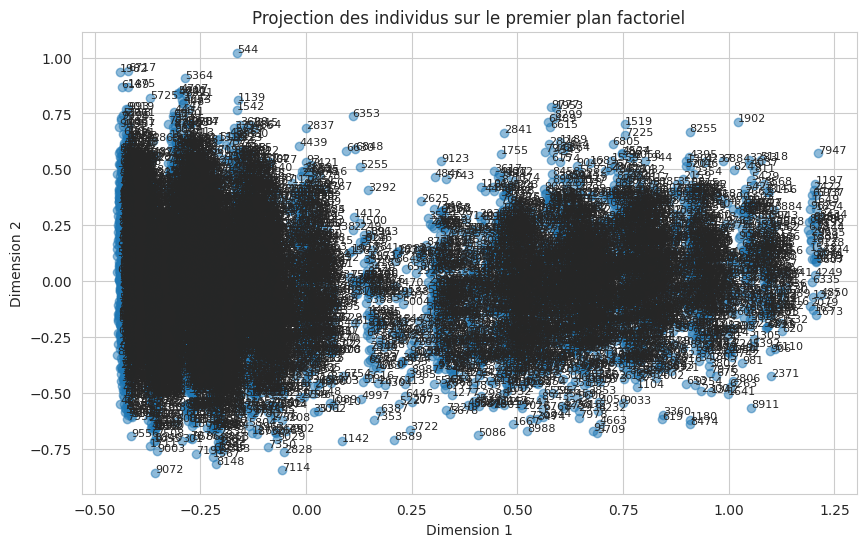

In [ ]:
# Projeter les individus sur le premier plan principal
row_coordinates = mca.row_coordinates(mca_data)

# Tracer la projection des individus
plt.figure(figsize=(10, 6))
plt.scatter(row_coordinates.iloc[:, 0], row_coordinates.iloc[:, 1], alpha=0.5)

# Ajouter des indices aux individus
for i in range(len(row_coordinates)):
    plt.text(row_coordinates.iloc[i, 0], row_coordinates.iloc[i, 1], str(i), fontsize=8)

plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Projection des individus sur le premier plan factoriel")
plt.grid(True)
plt.show()

# Classification non supervisée sur les composantes de l'ACM

## Clustering des individus

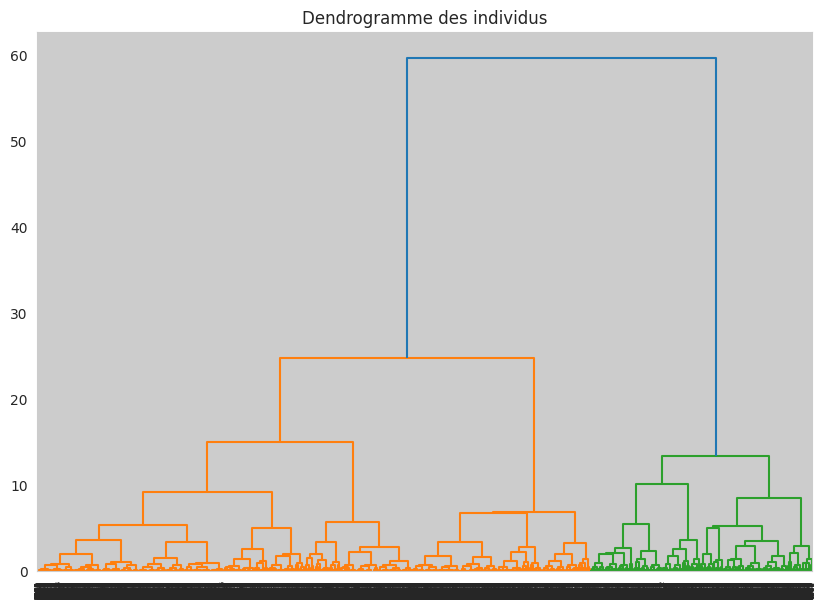

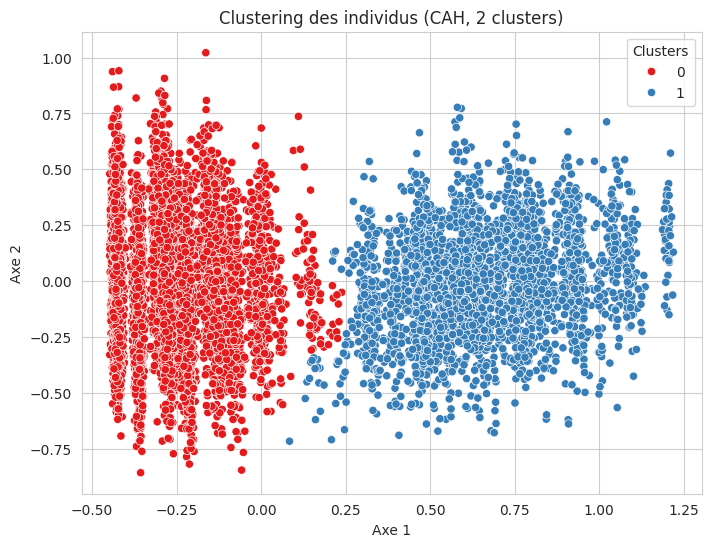

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram

# Obtenir les coordonnées des lignes (individus)
reduced_data = mca.row_coordinates(mca_data)
# Obtenir les coordonnées des colonnes (variables)
col_coords = mca.column_coordinates(mca_data)  # Ajout pour éviter l'erreur NameError

# CAH : Matrice de liaison et Dendrogramme
linked = linkage(reduced_data, method='ward')

plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title("Dendrogramme des individus")
plt.show()

# Clustering des individus avec la CAH
n_clusters = 2  # Ajustez en fonction du dendrogramme
clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
clusters = clustering.fit_predict(reduced_data)

# Ajout des clusters aux données
df['Cluster'] = clusters

# Visualisation des clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(x=reduced_data.iloc[:, 0], y=reduced_data.iloc[:, 1], hue=clusters, palette='Set1')
plt.title(f"Clustering des individus (CAH, {n_clusters} clusters)")
plt.xlabel("Axe 1")
plt.ylabel("Axe 2")
plt.legend(title="Clusters")
plt.show()


In [ ]:
# Créer row_coords à partir des coordonnées des individus issues de l'ACM
row_coords = mca.row_coordinates(mca_data).rename(columns={0: 'Dim1', 1: 'Dim2'}).reset_index(drop=True)
row_coords['Cluster'] = clusters  # clusters doit être de même longueur que row_coords

# Calcul des barycentres par cluster (moyenne des coordonnées des individus dans chaque cluster)
cluster_centers = row_coords.groupby('Cluster')[['Dim1', 'Dim2']].mean()
print("Barycentres par cluster :")
print(cluster_centers)

def assign_cluster(row, cluster_centers):
    modality_coords = row[['Dim1', 'Dim2']].values
    distances = []
    for cl in cluster_centers.index:
        center = cluster_centers.loc[cl, ['Dim1', 'Dim2']].values
        distances.append(np.linalg.norm(modality_coords - center))
    return cluster_centers.index[np.argmin(distances)]

# Assigner à chaque modalité (dans df_coordinates) le cluster le plus proche
df_coordinates['AssignedCluster'] = df_coordinates.apply(assign_cluster, axis=1, args=(cluster_centers,))

# Filtrer les modalités dont la contribution cumulée est supérieure à 3 fois le poids
df_coordinates_filtered = df_coordinates[df_coordinates['CTR_cum'] > 3 * df_coordinates['Poids']]

# Extraire la variable active à partir de l'étiquette de modalité (format "Variable__Catégorie")
df_coordinates_filtered['Variable'] = df_coordinates_filtered['Modalité'].apply(lambda x: x.split('__')[0])

# Identifier les variables qui apparaissent dans au moins 2 clusters
var_clusters = df_coordinates_filtered.groupby('Variable')['AssignedCluster'].nunique()
variables_interest = var_clusters[var_clusters > 1].index.tolist()

# Ne conserver que les modalités dont la variable apparaît dans au moins 2 clusters
df_coordinates_filtered = df_coordinates_filtered[df_coordinates_filtered['Variable'].isin(variables_interest)]

# Afficher les modalités filtrées par cluster, triées par contribution cumulée décroissante
for cl in cluster_centers.index:
    subset = df_coordinates_filtered[df_coordinates_filtered['AssignedCluster'] == cl]
    if subset.empty:
        print(f"\n🔹 Aucune modalité du Cluster {cl} ne satisfait les conditions.")
    else:
        subset_sorted = subset.sort_values(by='CTR_cum', ascending=False)
        print(f"\n🔹 Modalités associées au Cluster {cl} (CTR_cum > 3*Poids et variable multi-cluster, triées par CTR_cum décroissant) :")
        print(subset_sorted[['Dim1', 'Dim2', 'Modalité', 'CTR_cum', 'Poids', 'Variable']])


Barycentres par cluster :
             Dim1      Dim2
Cluster                    
0       -0.267390  0.001306
1        0.666235 -0.003255

🔹 Modalités associées au Cluster 0 (CTR_cum > 3*Poids et variable multi-cluster, triées par CTR_cum décroissant) :
                             Dim1      Dim2                 Modalité  \
Medication_Adherence__1  0.017766 -0.369923  Medication_Adherence__1   
Medication_Adherence__2 -0.440251  0.177895  Medication_Adherence__2   
Family_History__0       -0.341583 -0.014989        Family_History__0   
Substance_Use__0        -0.181070 -0.061802         Substance_Use__0   
Suicide_Attempt__0      -0.186035  0.004880       Suicide_Attempt__0   

                           CTR_cum   Poids              Variable  
Medication_Adherence__1  61.789033  0.3065  Medication_Adherence  
Medication_Adherence__2  59.006576  0.4155  Medication_Adherence  
Family_History__0        39.311704  0.6804        Family_History  
Substance_Use__0         17.026637  0.7823   

<ipython-input-34-6d2fbde259d5>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_coordinates_filtered['Variable'] = df_coordinates_filtered['Modalité'].apply(lambda x: x.split('__')[0])


In [ ]:
from sklearn.metrics import adjusted_rand_score

true_labels = df['Diagnosis']
predicted_labels = df['Cluster']


rand_index = adjusted_rand_score(true_labels, predicted_labels)
print(f"Adjusted Rand Index: {rand_index}")


Adjusted Rand Index: 0.9765645598836571


## Clustering des modalités

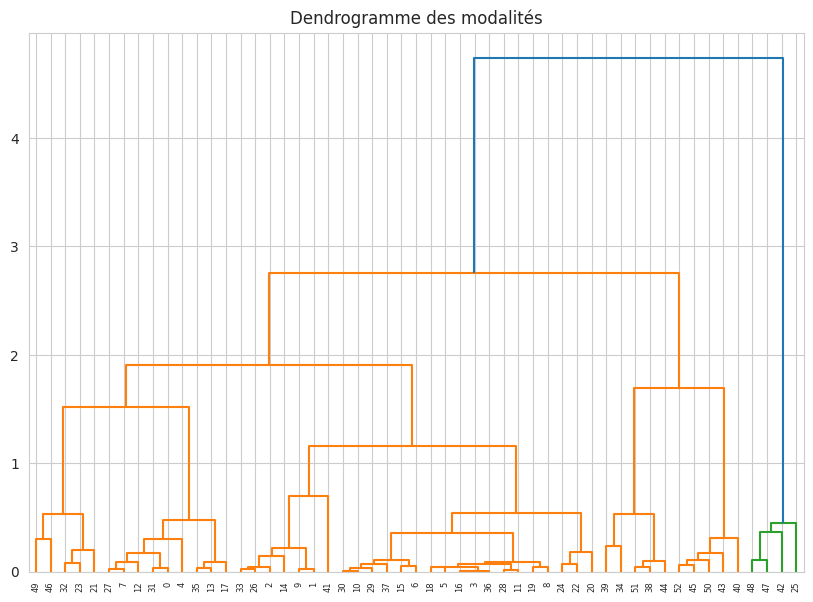

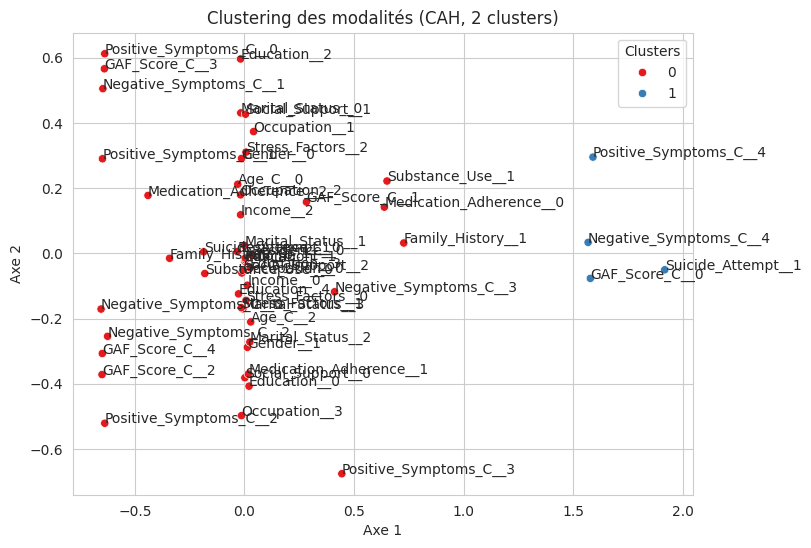

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import linkage, dendrogram


# Obtenir les coordonnées des lignes (individus)
reduced_data = mca.row_coordinates(mca_data)
# Obtenir les coordonnées des colonnes (variables)
col_coords = mca.column_coordinates(mca_data)  # Ajout pour éviter l'erreur NameError

# Récupérer les noms des modalités (colonnes) en se basant sur les colonnes de mca_data
modalite_names = col_coords.index if hasattr(col_coords, 'index') else [f"Modalité {i}" for i in range(len(col_coords))]

# CAH : Matrice de liaison et Dendrogramme pour les modalités
linked = linkage(col_coords, method='ward')

plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title("Dendrogramme des modalités")
plt.show()

# Clustering des modalités avec la CAH
n_clusters = 2  # Ajustez en fonction du dendrogramme
clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
clusters_modalites = clustering.fit_predict(col_coords)

# Ajout des clusters aux modalités
df_modalites = pd.DataFrame(col_coords)
df_modalites['Cluster'] = clusters_modalites

# Visualisation des clusters des modalités
plt.figure(figsize=(8, 6))
sns.scatterplot(x=col_coords.iloc[:, 0], y=col_coords.iloc[:, 1], hue=clusters_modalites, palette='Set1')

# Ajouter les noms des modalités sur le graphique
for i, txt in enumerate(modalite_names):
    plt.annotate(txt, (col_coords.iloc[i, 0], col_coords.iloc[i, 1]))

plt.title(f"Clustering des modalités (CAH, {n_clusters} clusters)")
plt.xlabel("Axe 1")
plt.ylabel("Axe 2")
plt.legend(title="Clusters")
plt.show()


# Analyse discriminante sur les composantes de l'ACM

## Sélection des variables

In [ ]:
# Identifier les modalités avec une faible contribution
threshold = 3 * p_rel  # Seuil de contribution minimale

# Sélectionner les modalités dont la contribution est supérieure au seuil
significant_modalities = df_coordinates[(df_coordinates['CTR_Dim1'] > threshold) | (df_coordinates['CTR_Dim2'] > threshold)]

print(f"Nombre de modalités retenues : {len(significant_modalities)}")
print(significant_modalities)
print(f"Modalités retenues : {significant_modalities['Modalité'].tolist()}")

# Identifier les modalités supprimées
removed_modalities = df_coordinates[~df_coordinates.index.isin(significant_modalities.index)]
print(f"Nombre de modalités supprimées : {len(removed_modalities)}")
print(f"Modalités supprimées : {removed_modalities['Modalité'].tolist()}")

# Filtrer les variables qualitatives pour ne garder que celles avec des modalités significatives
significant_vars = significant_modalities['Variable'].unique()

print(f"Variables qualitatives retenues : {significant_vars}")
print(f"Nombre de variables retenues : {len(significant_vars)}")

# Créer un nouveau DataFrame avec uniquement les variables qualitatives significatives
df_significant = df[[col for col in df.columns if col in significant_vars]]

print(f"Colonnes correspondantes dans le DataFrame : {df_significant.columns.tolist()}")

# Vérifier si le DataFrame réduit est vide
if df_significant.empty:
    raise ValueError("Le DataFrame réduit est vide. Vérifiez le seuil ou la structure des modalités.")

# Convertir les colonnes en catégories si ce n'est pas déjà le cas
for col in df_significant.columns:
    df_significant[col] = df_significant[col].astype('category')

# Appliquer à nouveau l'ACM sur le DataFrame réduit
mca_reduced = prince.MCA(n_components=2, random_state=42)
mca_fit_reduced = mca_reduced.fit(df_significant.apply(lambda x: x.cat.codes))

# Obtenir les nouvelles coordonnées des modalités
coordinates_reduced = mca_fit_reduced.column_coordinates(df_significant.apply(lambda x: x.cat.codes))

# Obtenir les nouvelles contributions des modalités
eigenvalues_reduced = np.array(mca_fit_reduced.eigenvalues_[:2])
contributions_reduced = (coordinates_reduced.iloc[:, :2] ** 2).div(eigenvalues_reduced, axis=1)
contributions_normalized_reduced = contributions_reduced.div(contributions_reduced.sum(axis=0), axis=1)

# Afficher les nouvelles contributions
print("\n🔹 Contributions des modalités après réduction :")
print(contributions_normalized_reduced)


Nombre de modalités retenues : 24
                             Dim1      Dim2                 Modalité   Poids  \
Gender__0               -0.013378  0.291241                Gender__0  0.4974   
Gender__1                0.013240 -0.288228                Gender__1  0.5026   
Education__2            -0.017823  0.596600             Education__2  0.1945   
Marital_Status__0       -0.017035  0.431158        Marital_Status__0  0.2424   
Marital_Status__2        0.024736 -0.271870        Marital_Status__2  0.2468   
Marital_Status__3       -0.007129 -0.169982        Marital_Status__3  0.2569   
Occupation__1            0.041683  0.373775            Occupation__1  0.2566   
Occupation__2           -0.017698  0.179610            Occupation__2  0.2478   
Occupation__3           -0.013553 -0.497744            Occupation__3  0.2528   
Income__2               -0.017511  0.118472                Income__2  0.3326   
Family_History__0       -0.341583 -0.014989        Family_History__0  0.6804   
Family

<ipython-input-37-3f0d057af0ea>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_significant[col] = df_significant[col].astype('category')



🔹 Contributions des modalités après réduction :
                                0         1
Gender__0                0.000155  0.032175
Gender__1                0.000152  0.031512
Education__0             0.000687  0.000456
Education__1             0.000010  0.001122
Education__2             0.000017  0.212787
Education__3             0.000012  0.119664
Education__4             0.000785  0.003742
Marital_Status__0        0.000001  0.092027
Marital_Status__1        0.000048  0.000610
Marital_Status__2        0.000657  0.022143
Marital_Status__3        0.000351  0.014132
Occupation__0            0.000029  0.164077
Occupation__1            0.001042  0.083358
Occupation__2            0.000546  0.003751
Occupation__3            0.000022  0.024342
Income__0                0.000266  0.002837
Income__1                0.000050  0.014413
Income__2                0.000088  0.004352
Family_History__0        0.022727  0.000041
Family_History__1        0.103004  0.000187
Substance_Use__0         0.

## Gaussian Naive Bayes

Gaussian Naive Bayes - Cross-validation scores: [0.8025   0.81125  0.796875 0.806875 0.7975  ]
Gaussian Naive Bayes - Mean accuracy: 0.8030000000000002
Gaussian Naive Bayes - Test accuracy: 0.7865


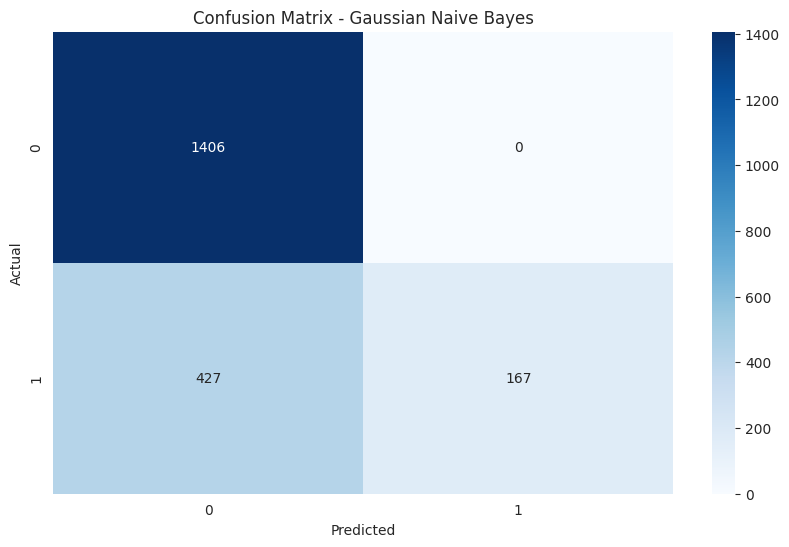

In [ ]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt



# Prepare the data for classification
X = df_significant.apply(lambda x: x.cat.codes) # Use numerical representation
y = df['Diagnosis'].cat.codes # Convert target variable to numerical codes

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# 1. Gaussian Naive Bayes
gnb = GaussianNB()
gnb_scores = cross_val_score(gnb, X_train, y_train, cv=5)  # 5-fold cross-validation
print("Gaussian Naive Bayes - Cross-validation scores:", gnb_scores)
print("Gaussian Naive Bayes - Mean accuracy:", gnb_scores.mean())

# Train and evaluate on test data
gnb.fit(X_train, y_train)
gnb_pred = gnb.predict(X_test)
gnb_accuracy = accuracy_score(y_test, gnb_pred)
print("Gaussian Naive Bayes - Test accuracy:", gnb_accuracy)

# Confusion matrix for Gaussian Naive Bayes
gnb_cm = confusion_matrix(y_test, gnb_pred)
sns.heatmap(gnb_cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix - Gaussian Naive Bayes')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()




## K-Nearest Neighbors

K-NN (k=2) - Cross-validation scores: [0.763125 0.746875 0.753125 0.755    0.75375 ]
K-NN (k=2) - Mean accuracy: 0.754375
K-NN (k=3) - Cross-validation scores: [0.7875   0.769375 0.7675   0.773125 0.77125 ]
K-NN (k=3) - Mean accuracy: 0.7737499999999999
K-NN (k=4) - Cross-validation scores: [0.78125  0.7725   0.761875 0.771875 0.769375]
K-NN (k=4) - Mean accuracy: 0.771375
K-NN (k=5) - Cross-validation scores: [0.786875 0.789375 0.77375  0.78125  0.785625]
K-NN (k=5) - Mean accuracy: 0.783375
K-NN (k=6) - Cross-validation scores: [0.775625 0.77875  0.755    0.773125 0.78125 ]
K-NN (k=6) - Mean accuracy: 0.77275
K-NN (k=7) - Cross-validation scores: [0.786875 0.793125 0.774375 0.775    0.7925  ]
K-NN (k=7) - Mean accuracy: 0.784375
K-NN (k=8) - Cross-validation scores: [0.78125  0.78125  0.756875 0.76625  0.775   ]
K-NN (k=8) - Mean accuracy: 0.772125
K-NN (k=9) - Cross-validation scores: [0.79375  0.78625  0.77125  0.781875 0.786875]
K-NN (k=9) - Mean accuracy: 0.784
K-NN (k=10) - Cros

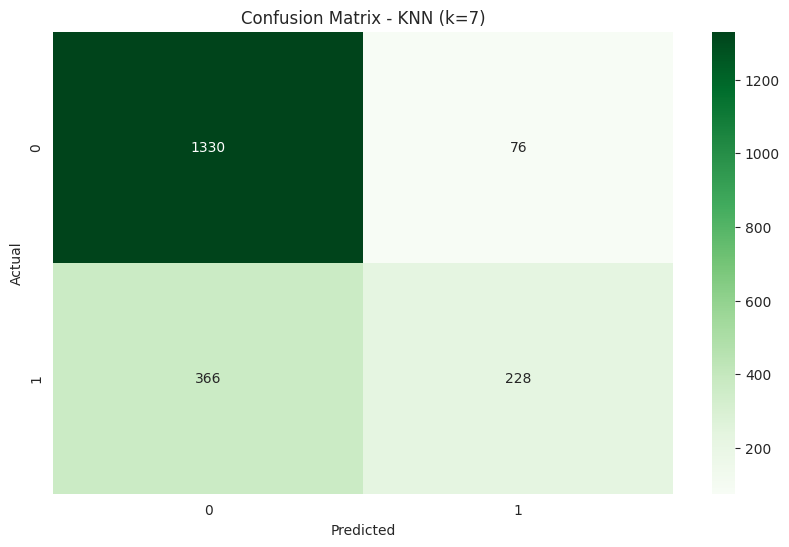

In [ ]:
# 2. K-Nearest Neighbors
best_k = 2
best_knn_score = 0
for k in [2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 15, 30, 50]:
    knn = KNeighborsClassifier(n_neighbors=k)
    knn_scores = cross_val_score(knn, X_train, y_train, cv=5)
    mean_accuracy = knn_scores.mean()
    print(f"K-NN (k={k}) - Cross-validation scores: {knn_scores}")
    print(f"K-NN (k={k}) - Mean accuracy: {mean_accuracy}")
    if mean_accuracy > best_knn_score :
        best_knn_score = mean_accuracy
        best_k = k

print(f"\nBest K for KNN: {best_k}")

# Train and evaluate the best KNN model on test data
knn = KNeighborsClassifier(n_neighbors=best_k)
knn.fit(X_train,y_train)
knn_pred = knn.predict(X_test)
knn_accuracy = accuracy_score(y_test,knn_pred)
print(f"KNN (k={best_k}) - Test accuracy:", knn_accuracy)

# Confusion matrix for the best KNN model
knn_cm = confusion_matrix(y_test, knn_pred)
sns.heatmap(knn_cm, annot=True, fmt='d', cmap='Greens')
plt.title(f'Confusion Matrix - KNN (k={best_k})')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()